In [1]:
import rapids_singlecell as rsc

## **Import Packages for GPU-based**

In [2]:
import scanpy as sc 
import pandas as pd
import seaborn as sns
import numpy as np
from scipy.stats import median_abs_deviation
import os
import warnings
warnings.filterwarnings('ignore', 'Expected')
warnings.simplefilter('ignore')

import anndata 
from anndata import AnnData
import matplotlib

import time
import cuda
import cudf
import cupy

from cuml.decomposition import PCA
from cuml.manifold import TSNE
from cuml.cluster import KMeans
from cuml.preprocessing import StandardScaler



In [3]:
import tensorflow as tf

print(tf.config.list_physical_devices('GPU'))

2024-05-31 19:41:54.126717: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-31 19:41:54.173271: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-31 19:41:54.173308: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-31 19:41:54.174205: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-31 19:41:54.180359: I tensorflow/core/platform/cpu_feature_guar

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:4', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:5', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:6', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:7', device_type='GPU')]


In [4]:
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator

rmm.reinitialize(
    managed_memory=True,
)

cupy.cuda.set_allocator(rmm_cupy_allocator)

In [5]:
print(sc.__dir__())

['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__path__', '__file__', '__cached__', '__builtins__', '_version', '__version__', 'logging', '_settings', '_utils', '_compat', 'settings', 'Verbosity', 'get', 'neighbors', 'preprocessing', 'readwrite', 'tools', 'tl', 'pp', 'plotting', 'pl', 'datasets', 'queries', 'external', 'metrics', 'experimental', 'AnnData', 'concat', 'read_h5ad', 'read_csv', 'read_excel', 'read_hdf', 'read_loom', 'read_mtx', 'read_text', 'read_umi_tools', 'read', 'read_10x_h5', 'read_10x_mtx', 'write', 'read_visium', 'Neighbors', 'set_figure_params']


In [6]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.9.8 anndata==0.10.6 umap==0.5.5 numpy==1.24.4 scipy==1.12.0 pandas==1.5.3 scikit-learn==1.4.1.post1 statsmodels==0.14.1 pynndescent==0.5.11


In [7]:
results_file = "/home/supakorn/rscript/results/GSE178146/GSE178146_test_removedbg.h5ad"

In [8]:
directory = '/home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/'
dirs = os.listdir(directory)
print(dirs)

['C34_raw_matrix_denoised_metrics.csv', 'C87_raw_matrix_denoised_cell_barcodes.csv', 'C36_raw_matrix_denoised_filtered.h5', 'DLB566_raw_matrix_denoised.log', 'PD666_raw_matrix_denoised_cell_barcodes.csv', 'DLB115_raw_matrix_denoised_filtered.h5', 'PD416_raw_matrix_denoised.h5', 'C34_raw_matrix_denoised_filtered.h5', 'PDD501_raw_matrix_denoised.h5', 'PD413_raw_matrix_denoised.log', 'PDD366_raw_matrix_denoised_cell_barcodes.csv', 'PDD341_raw_matrix_denoised.h5', 'DLB332_raw_matrix_denoised.log', 'PDD341_raw_matrix_denoised.pdf', 'DLB332_raw_matrix_denoised.h5', 'DLB332_raw_matrix_denoised.h_posterior.h5', 'PD666_raw_matrix_denoised_filtered.h5', 'DLB332_raw_matrix_denoised.pdf', 'PDD531_raw_matrix_denoised_filtered.h5', 'DLB706_raw_matrix_denoised.log', 'PDD678_raw_matrix_denoised.h5', 'PDD415_raw_matrix_denoised_metrics.csv', 'C22_raw_matrix_denoised.h5', 'C36_raw_matrix_denoised.log', 'PDD341_raw_matrix_denoised_cell_barcodes.csv', 'DLB566_raw_matrix_denoised.h_posterior.h5', 'PDD501_r

In [9]:
list(dirs)

['C34_raw_matrix_denoised_metrics.csv',
 'C87_raw_matrix_denoised_cell_barcodes.csv',
 'C36_raw_matrix_denoised_filtered.h5',
 'DLB566_raw_matrix_denoised.log',
 'PD666_raw_matrix_denoised_cell_barcodes.csv',
 'DLB115_raw_matrix_denoised_filtered.h5',
 'PD416_raw_matrix_denoised.h5',
 'C34_raw_matrix_denoised_filtered.h5',
 'PDD501_raw_matrix_denoised.h5',
 'PD413_raw_matrix_denoised.log',
 'PDD366_raw_matrix_denoised_cell_barcodes.csv',
 'PDD341_raw_matrix_denoised.h5',
 'DLB332_raw_matrix_denoised.log',
 'PDD341_raw_matrix_denoised.pdf',
 'DLB332_raw_matrix_denoised.h5',
 'DLB332_raw_matrix_denoised.h_posterior.h5',
 'PD666_raw_matrix_denoised_filtered.h5',
 'DLB332_raw_matrix_denoised.pdf',
 'PDD531_raw_matrix_denoised_filtered.h5',
 'DLB706_raw_matrix_denoised.log',
 'PDD678_raw_matrix_denoised.h5',
 'PDD415_raw_matrix_denoised_metrics.csv',
 'C22_raw_matrix_denoised.h5',
 'C36_raw_matrix_denoised.log',
 'PDD341_raw_matrix_denoised_cell_barcodes.csv',
 'DLB566_raw_matrix_denoised.h

In [10]:
metric = []

for file in [x for x in dirs if x.endswith('metrics.csv')]:
    
    metric_df = pd.read_csv(directory + file, header = None, names = ['Metric', 'Value']).set_index('Metric').T
    
    metric_df['File'] = file
    metric.append(metric_df)
    
metric = pd.concat(metric).reset_index()

In [11]:
metric

Metric,index,total_raw_counts,total_output_counts,total_counts_removed,fraction_counts_removed,total_raw_counts_in_cells,total_counts_removed_from_cells,fraction_counts_removed_from_cells,average_counts_removed_per_cell,target_fpr,expected_cells,found_cells,output_average_counts_per_cell,ratio_of_found_cells_to_expected_cells,found_empties,fraction_of_analyzed_droplets_that_are_nonempty,convergence_indicator,overall_change_in_train_elbo,File
0,Value,50288620.0,48720200.0,1568420.0,0.031,50288628.0,1568428.0,0.031,161.311,0.01,4302.0,9723.0,5010.820,2.260,20277.0,0.324,0.955,1594.747,C34_raw_matrix_denoised_metrics.csv
1,Value,23940950.0,22307235.0,1633715.0,0.068,23940952.0,1633717.0,0.068,181.544,0.01,3469.0,8999.0,2478.857,2.594,21001.0,0.300,0.467,652.622,PDD415_raw_matrix_denoised_metrics.csv
2,Value,11286424.0,9743807.0,1542617.0,0.137,11286424.0,1542617.0,0.137,143.286,0.01,4281.0,10766.0,905.054,2.515,19234.0,0.359,0.404,275.589,PDD501_raw_matrix_denoised_metrics.csv
3,Value,28985118.0,27516280.0,1468838.0,0.051,28985120.0,1468840.0,0.051,155.829,0.01,4232.0,9426.0,2919.189,2.227,20574.0,0.314,1.295,910.982,DLB706_raw_matrix_denoised_metrics.csv
4,Value,40059940.0,38749744.0,1310196.0,0.033,40059944.0,1310200.0,0.033,150.893,0.01,3636.0,8683.0,4462.714,2.388,21317.0,0.289,0.693,1191.546,PD413_raw_matrix_denoised_metrics.csv
5,Value,17405884.0,16310475.0,1095409.0,0.063,17405884.0,1095409.0,0.063,128.690,0.01,3225.0,8512.0,1916.174,2.639,21488.0,0.284,0.833,445.472,PDD366_raw_matrix_denoised_metrics.csv
6,Value,50941396.0,49209968.0,1731428.0,0.034,50941384.0,1731416.0,0.034,165.480,0.01,4619.0,10463.0,4703.237,2.265,19537.0,0.349,0.778,1480.031,PDD563_raw_matrix_denoised_metrics.csv
7,Value,24257510.0,22038348.0,2219162.0,0.091,24257510.0,2219162.0,0.091,182.527,0.01,4238.0,12158.0,1812.662,2.869,17842.0,0.405,0.638,613.867,DLB163_raw_matrix_denoised_metrics.csv
8,Value,54763356.0,52846621.0,1916735.0,0.035,54763368.0,1916747.0,0.035,208.682,0.01,3683.0,9185.0,5753.579,2.494,20815.0,0.306,1.265,1566.052,PD747_raw_matrix_denoised_metrics.csv
9,Value,18165868.0,16807988.0,1357880.0,0.075,18165866.0,1357878.0,0.075,127.512,0.01,4332.0,10649.0,1578.363,2.458,19351.0,0.355,0.316,504.721,PDD531_raw_matrix_denoised_metrics.csv


array([[<Axes: title={'center': 'fraction_counts_removed'}>]],
      dtype=object)

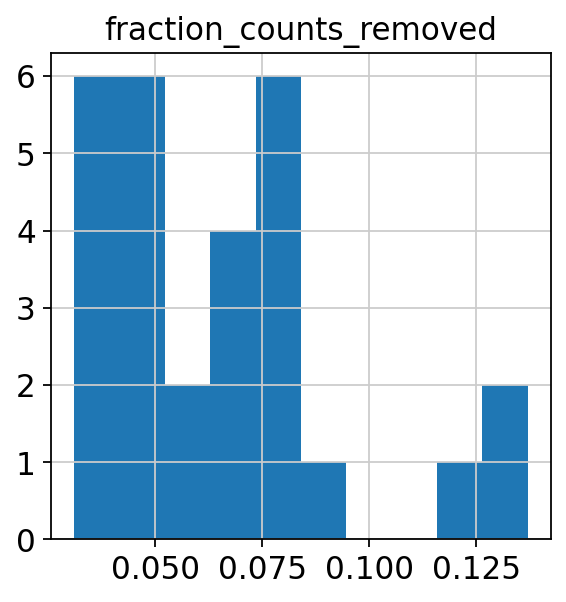

In [12]:
metric.hist('fraction_counts_removed')

### **Remove Noise BackGround and Create AnnData object**

In [13]:
list_adata = [x for x in dirs if x.endswith('filtered.h5')]

In [14]:
list_adata

['C36_raw_matrix_denoised_filtered.h5',
 'DLB115_raw_matrix_denoised_filtered.h5',
 'C34_raw_matrix_denoised_filtered.h5',
 'PD666_raw_matrix_denoised_filtered.h5',
 'PDD531_raw_matrix_denoised_filtered.h5',
 'PDD341_raw_matrix_denoised_filtered.h5',
 'PD732_raw_matrix_denoised_filtered.h5',
 'PD523_raw_matrix_denoised_filtered.h5',
 'PD683_raw_matrix_denoised_filtered.h5',
 'PD413_raw_matrix_denoised_filtered.h5',
 'DLB163_raw_matrix_denoised_filtered.h5',
 'PDD366_raw_matrix_denoised_filtered.h5',
 'PDD415_raw_matrix_denoised_filtered.h5',
 'PDD678_raw_matrix_denoised_filtered.h5',
 'PDD501_raw_matrix_denoised_filtered.h5',
 'PDD563_raw_matrix_denoised_filtered.h5',
 'C22_raw_matrix_denoised_filtered.h5',
 'DLB294_raw_matrix_denoised_filtered.h5',
 'DLB060_raw_matrix_denoised_filtered.h5',
 'PD747_raw_matrix_denoised_filtered.h5',
 'DLB332_raw_matrix_denoised_filtered.h5',
 'C87_raw_matrix_denoised_filtered.h5',
 'C05_raw_matrix_denoised_filtered.h5',
 'C91_raw_matrix_denoised_filter

In [15]:
dfs = []
patient_adata_list = []

for filename in list_adata:
    
    # Replace suffix name and split file's name 
    name = filename.replace('_raw_matrix_denoised_filtered.h5', '').split('_')
    patient = name[0]
    
    
    #matrix_file = os.path.join(dirs, filename)
    
    
    # Make adata metadata
    adata = sc.read_10x_h5(directory + filename)
    adata.var_names_make_unique()
    #adata.write_h5ad('/home/supakorn/rscript/dataset/GSE178146/GSE178146h5ad/' + patient + '_raw_matrix' + '.h5ad')
    
    
    # Append metadata in patient_adata_list
    patient_adata_list.append(adata)
    adata.obs['Patient'] = patient
    
    
    # Create Adata DataFrame and append 
    df = pd.DataFrame(adata.obs)
    dfs.append(df)

# Merge DataFrame
merge_df = pd.concat(dfs)



reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/C36_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/DLB115_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/C34_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PD666_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PDD531_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PDD341_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PD732_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PD523_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremov

In [16]:
#select GPU environment *****

#os.environ['CUDA_VISIBLE_DEVICES'] = '1,2'

In [17]:
#%%sh
#cd ../dataset/GSE178146/GSE178146h5ad
#for file in *h5ad; do cellbender remove-background --input $file --output /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/$(basename $file .h5ad)_denoised.h5ad  --total-droplets-included 50000 --cuda --checkpoint /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/$(basename $file .h5ad).ckpt.tar.gz ; done

In [18]:
# Concatenate adata list of patient_adata_list
merged_adata = anndata.concat(patient_adata_list, join='outer', merge='same')

In [19]:
merged_adata

AnnData object with n_obs × n_vars = 279488 × 33538
    obs: 'Patient'
    var: 'gene_ids', 'feature_types', 'genome'

In [20]:
merge_df

,Patient
GCGCCAATCTTGCAAG-1,C36
CCTTTCTAGATACACA-1,C36
AAGGAGCTCGTACGGC-1,C36
ACACCAAAGCTAAACA-1,C36
GATCGCGCAGCCTTTC-1,C36
...,...
TGCACCTGTTCGGGCT-1,PD416
CGCCAAGCAGGGCATA-1,PD416
GTTACAGGTCAAAGCG-1,PD416
CTCAGAATCCAGAGGA-1,PD416


In [21]:
def categorize_patient(patient):
    if patient.startswith('C'):
        return 'CTL'
    elif patient.startswith('PD'):
        if patient.startswith('PDD'):
            return 'PDD'
        else: 
            return 'PD'
    elif patient.startswith('DLB'):
        return 'DLB'
    else:
        return 'Unknown'

In [22]:
merged_adata.obs['Conditions'] = merged_adata.obs['Patient'].apply(categorize_patient)

In [23]:
merged_adata.obs['Conditions'].unique()

array(['CTL', 'DLB', 'PD', 'PDD'], dtype=object)

In [24]:
merged_adata

AnnData object with n_obs × n_vars = 279488 × 33538
    obs: 'Patient', 'Conditions'
    var: 'gene_ids', 'feature_types', 'genome'

In [25]:
print(merged_adata.obs.value_counts())
print(merged_adata.obs.Patient)

Patient  Conditions
C05      CTL           14965
C22      CTL           14258
C48      CTL           12620
DLB163   DLB           12158
PD683    PD            11878
C91      CTL           11641
C36      CTL           10969
PD666    PD            10875
PDD501   PDD           10766
PDD531   PDD           10649
PDD563   PDD           10463
DLB115   DLB           10301
PDD341   PDD           10177
C34      CTL            9723
DLB706   DLB            9426
PD747    PD             9185
DLB566   DLB            9185
PDD415   PDD            8999
PD416    PD             8836
PD413    PD             8683
PDD366   PDD            8512
PD523    PD             8269
C87      CTL            8206
PDD678   PDD            8205
DLB332   DLB            8046
DLB060   DLB            8014
PD732    PD             7639
DLB294   DLB            6840
dtype: int64
GCGCCAATCTTGCAAG-1      C36
CCTTTCTAGATACACA-1      C36
AAGGAGCTCGTACGGC-1      C36
ACACCAAAGCTAAACA-1      C36
GATCGCGCAGCCTTTC-1      C36
               

In [26]:
merged_adata.X

<279488x33538 sparse matrix of type '<class 'numpy.float64'>'
	with 353761349 stored elements in Compressed Sparse Row format>

In [27]:
#AnnData.write(filename="/home/supakorn/rscript/GSE184950/GSE184950_dataset.h5ad", merged_adata=merged_adata)

In [28]:
rsc.get.anndata_to_GPU(merged_adata) ## Move adata.X to GPU
#rsc.get.anndata_to_CPU(merged_adata) ## Move adata.X to CPU

## **Quality Control and Filtering**

In [29]:
#merged_adata.var["mt"] = merged_adata.var_names.str.startswith("MT-")

rsc.pp.flag_gene_family(merged_adata, gene_family_name="mt", gene_family_prefix="MT-")

rsc.pp.calculate_qc_metrics(
    merged_adata, 
    qc_vars=["mt"], 
    log1p=True,
    #percent_top=[20],
    #inplace=True
    )

In [30]:
merged_adata

AnnData object with n_obs × n_vars = 279488 × 33538
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

### **Plot QC**

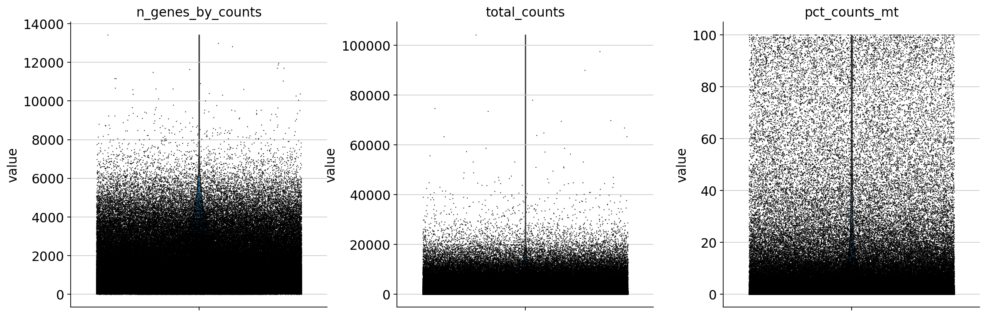

In [31]:
sc.pl.violin(
    merged_adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True)

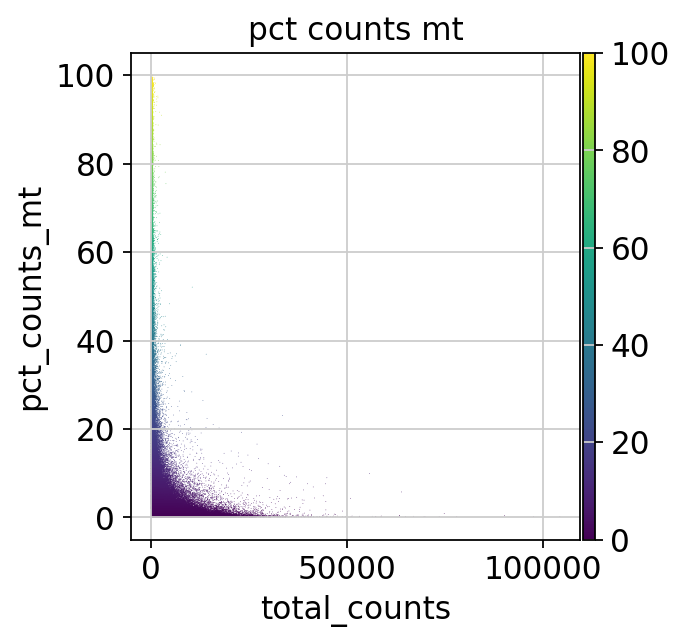

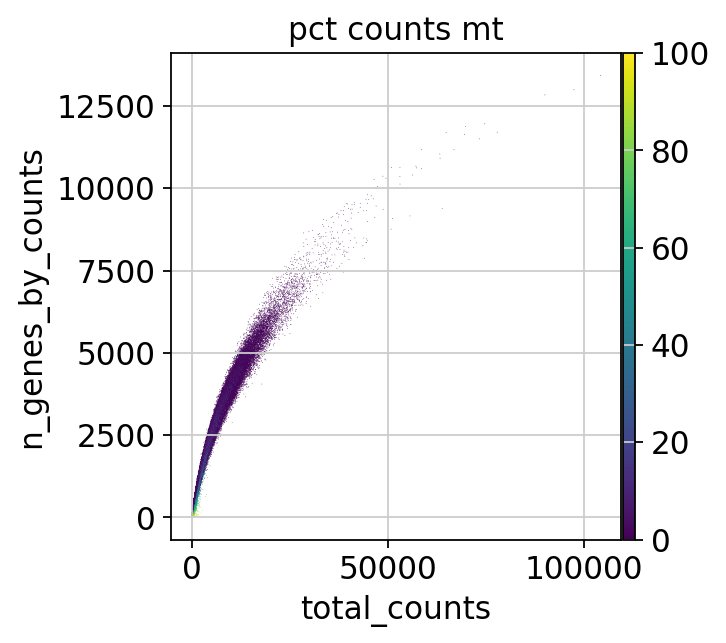

In [32]:
sc.pl.scatter(merged_adata, x="total_counts", y="pct_counts_mt", color="pct_counts_mt")
sc.pl.scatter(merged_adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

### **Outlier Threshold**

#### ***MAD = median(|Xi - median(X)|)***
Xi is the respective QC metric of an observation and 
describes a robust statistic of the variability of the metric.
[Germain et al., 2020]

In [33]:
#def is_outlier(merged_adata, metric: str, nmads: int):
#    M = merged_adata.obs[metric]
#    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
#        np.median(M) + nmads * median_abs_deviation(M) < M
#    )
#    return outlier

In [34]:
#merged_adata.obs["outlier"] = (
#    is_outlier(merged_adata, "log1p_total_counts", 5) |
#    is_outlier(merged_adata, "log1p_n_genes_by_counts", 5) #|
#    #is_outlier(merged_adata, "pct_counts_in_top_20_genes", 5)    
#)
#merged_adata.obs.outlier.value_counts()

In [35]:
#merged_adata.obs["mt_outlier"] = is_outlier(merged_adata, "pct_counts_mt", 3) | (
#    merged_adata.obs["pct_counts_mt"] > 20
#)
#merged_adata.obs.mt_outlier.value_counts()

In [36]:
#print(f"Total number of cells: {merged_adata.n_obs}")
#merged_adata = merged_adata[(~merged_adata.obs.outlier) & (~merged_adata.obs.mt_outlier)].copy()
#
#print(f"Number of cells after filtering of low quality cells: {merged_adata.n_obs}")

In [37]:
#sc.pl.scatter(merged_adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

### **Filtering**

In [38]:
merged_adata

AnnData object with n_obs × n_vars = 279488 × 33538
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

In [39]:
#print(f"Total number of genes: {merged_adata.n_vars}")
#rsc.pp.filter_cells(merged_adata, min_count=3)
#rsc.pp.filter_cells(merged_adata, max_count=20000)
#print(f"Number of genes after cell filter: {merged_adata.n_vars}")


merged_adata = merged_adata[merged_adata.obs.pct_counts_mt < 10, :]
merged_adata = merged_adata[merged_adata.obs.n_genes_by_counts < 6000, :]
merged_adata = merged_adata[merged_adata.obs.n_genes_by_counts > 200, :]
merged_adata = merged_adata[merged_adata.obs.total_counts < 40000, :]

In [40]:
rsc.pp.filter_genes(merged_adata, min_count=3)

filtered out 4128 genes based on n_cells_by_counts


In [41]:
merged_adata

AnnData object with n_obs × n_vars = 213478 × 29410
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

### **Plot after filtering**

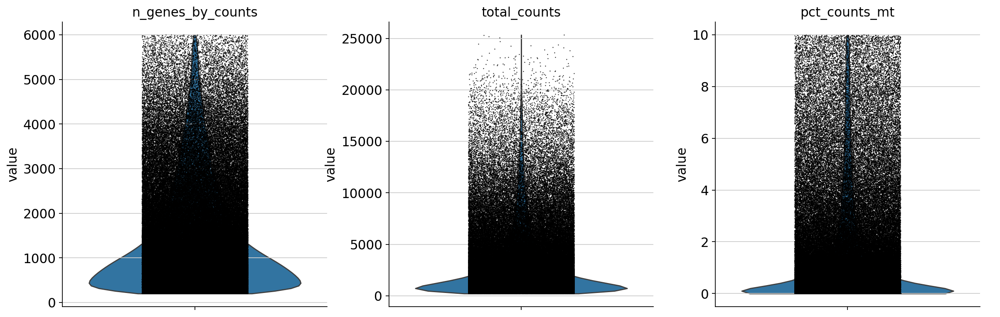

In [42]:
sc.pl.violin(
    merged_adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.2,
    multi_panel=True)

In [47]:
merged_adata.layers["counts"] = merged_adata.X.copy()
merged_adata.shape

(213478, 29410)

In [45]:
merged_adata

AnnData object with n_obs × n_vars = 213478 × 29410
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

In [ ]:
merged_adata = merged_adata[merged_adata.obs["features_type"]]

In [43]:
merged_adata.write("/home/supakorn/rscript/dataset/GSE178146/GSE178146_no_norm.h5ad")

## **Normalization**

In [48]:
rsc.pp.normalize_total(merged_adata, target_sum=1e4)

In [45]:
rsc.pp.log1p(merged_adata)

In [46]:
rsc.pp.highly_variable_genes(merged_adata, n_top_genes=5000, flavor="seurat_v3", layer = "counts")


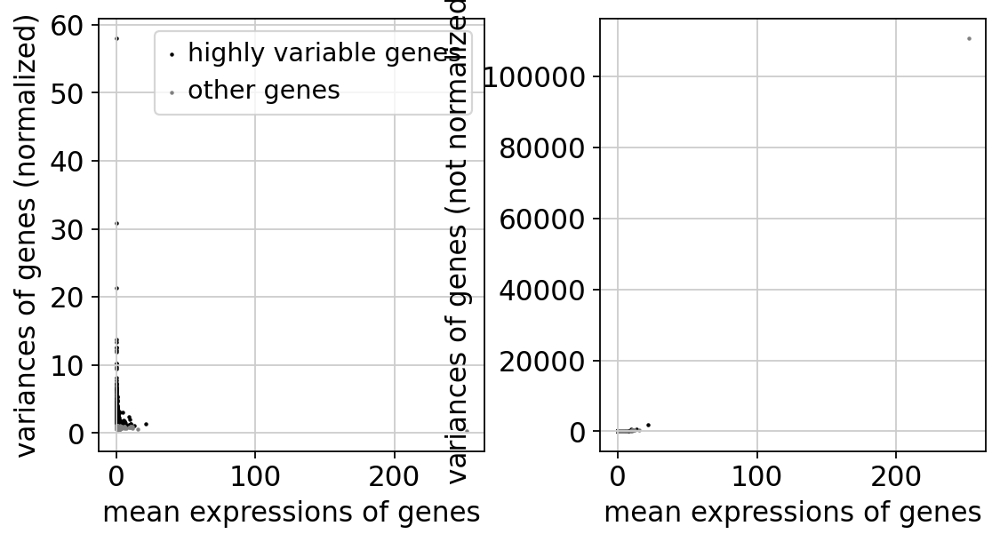

In [47]:
sc.pl.highly_variable_genes(merged_adata)

### Create .raw file

In [48]:
merged_adata.raw = merged_adata

In [49]:
merged_adata = merged_adata[:, merged_adata.var.highly_variable]

## **Regress out unwanted variable**

In [50]:
rsc.pp.regress_out(merged_adata, keys=["pct_counts_mt"])

## **Scale Data**

In [51]:
rsc.pp.scale(merged_adata, max_value=10)

## **Plot PCA**

In [52]:
rsc.pp.pca(merged_adata, n_comps=100)

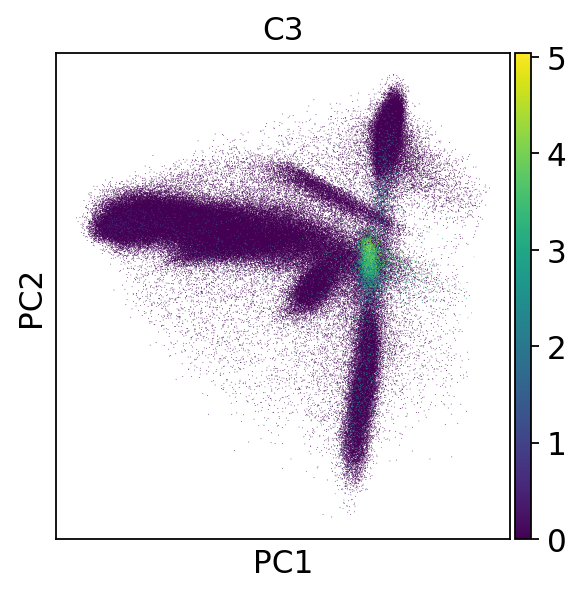

In [53]:
sc.pl.pca(merged_adata, color="C3")

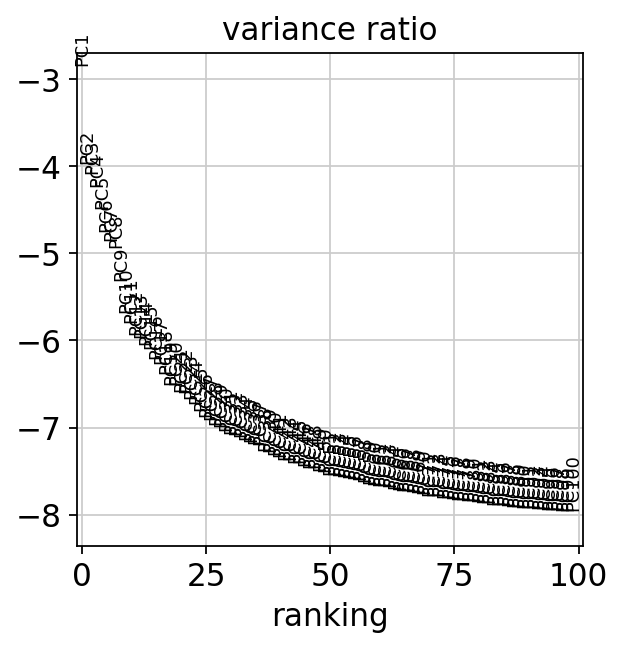

In [54]:
sc.pl.pca_variance_ratio(merged_adata, log=True, n_pcs=100)

In [55]:
rsc.get.anndata_to_CPU(merged_adata, convert_all=True)

In [56]:
merged_adata.write(results_file)

### **Batch Correction**

In [57]:
rsc.pp.harmony_integrate(merged_adata, key="Patient")

2024-04-26 15:46:02,438 - harmonypy_gpu - INFO - Iteration 1 of 10
2024-04-26 15:46:18,988 - harmonypy_gpu - INFO - Iteration 2 of 10
2024-04-26 15:46:35,536 - harmonypy_gpu - INFO - Iteration 3 of 10
2024-04-26 15:46:52,077 - harmonypy_gpu - INFO - Iteration 4 of 10
2024-04-26 15:47:08,530 - harmonypy_gpu - INFO - Iteration 5 of 10
2024-04-26 15:47:21,675 - harmonypy_gpu - INFO - Converged after 5 iterations


## **Find Neighbors**

In [58]:
rsc.pp.neighbors(merged_adata, n_neighbors=15, n_pcs=30)

In [59]:
rsc.tl.umap(merged_adata)
rsc.tl.tsne(merged_adata, perplexity=5, learning_rate=200)


## **Clustering and Visualization**

In [60]:
rsc.tl.leiden(merged_adata, resolution=0.3)
rsc.tl.louvain(merged_adata, resolution=0.3)

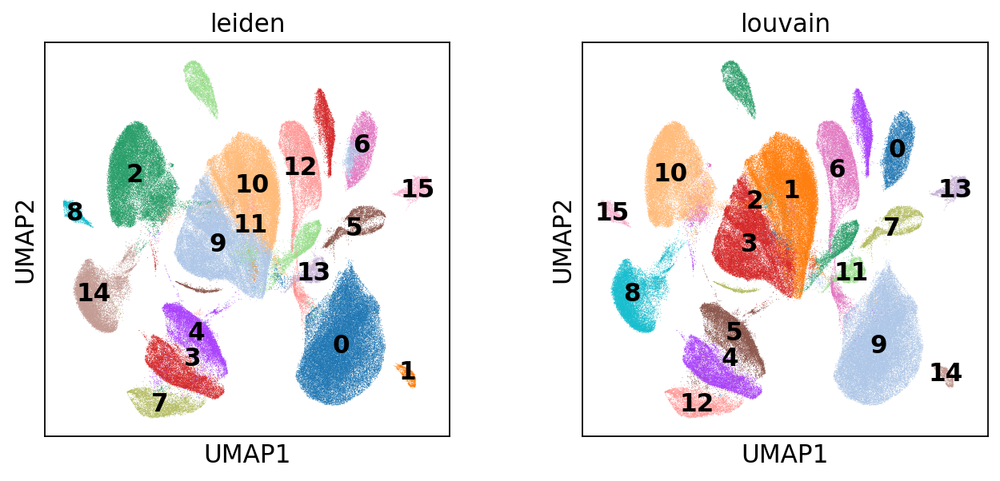

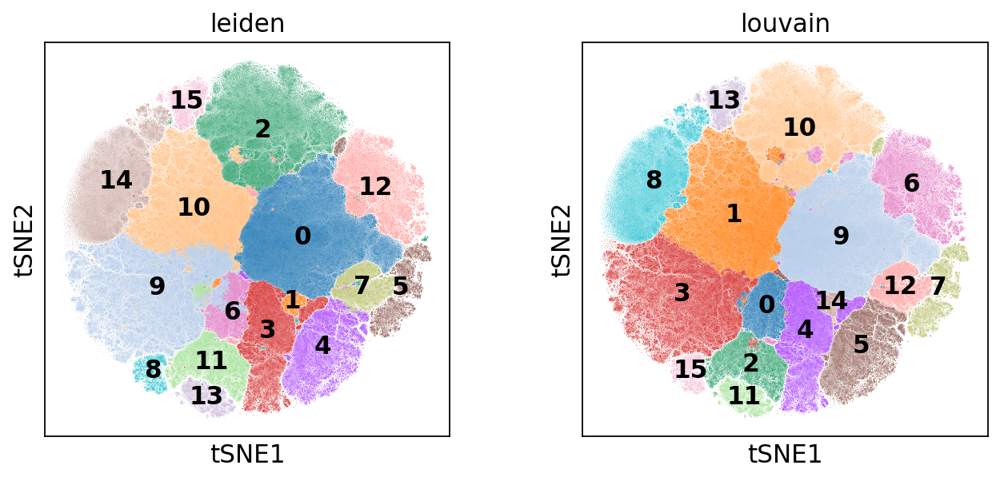

In [61]:
sc.pl.umap(merged_adata, color=["leiden", "louvain"], legend_loc="on data")
sc.pl.tsne(merged_adata, color=["leiden", "louvain"], legend_loc="on data")

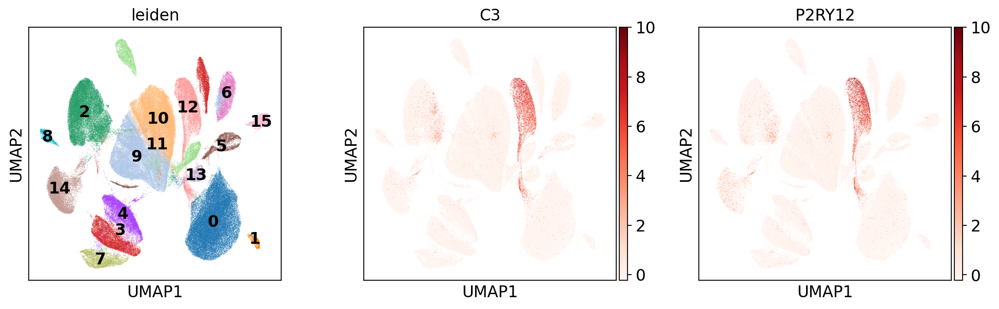

In [62]:
sc.pl.umap(merged_adata, color=["leiden", "C3", "P2RY12"], legend_loc="on data", use_raw=False, color_map='Reds')

In [63]:
merged_adata.write(results_file)

### UMAP and TSNE with Kmeans

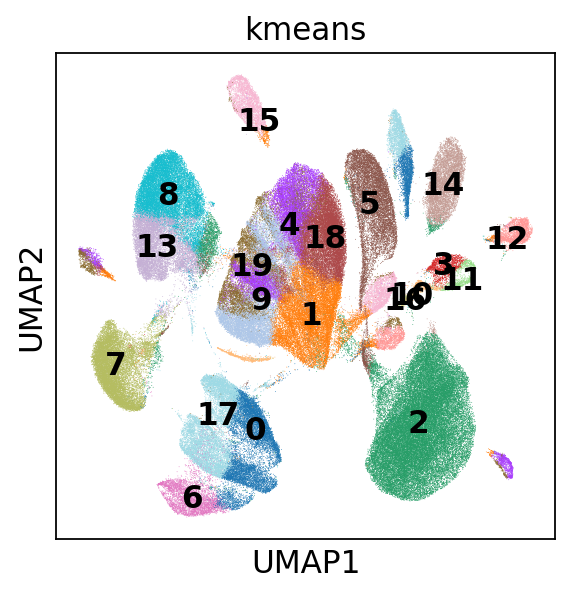

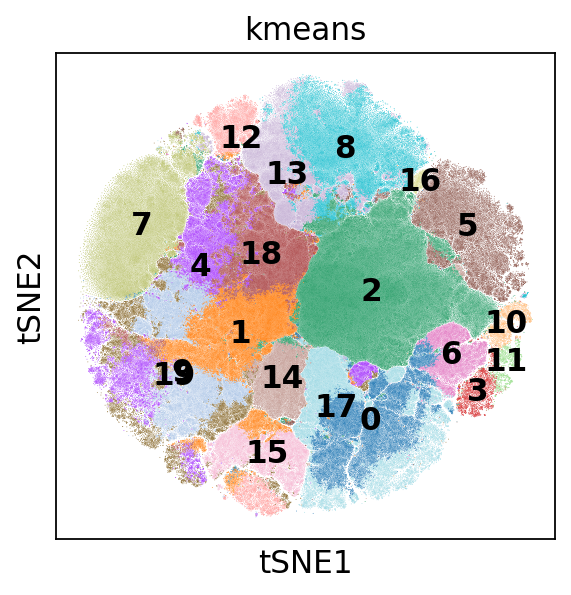

In [64]:
rsc.tl.kmeans(merged_adata, n_clusters=20)

sc.pl.umap(merged_adata, color=["kmeans"], legend_loc = 'on data')
sc.pl.tsne(merged_adata, color=["kmeans"], legend_loc = 'on data')

### Embedding density in the UMAP

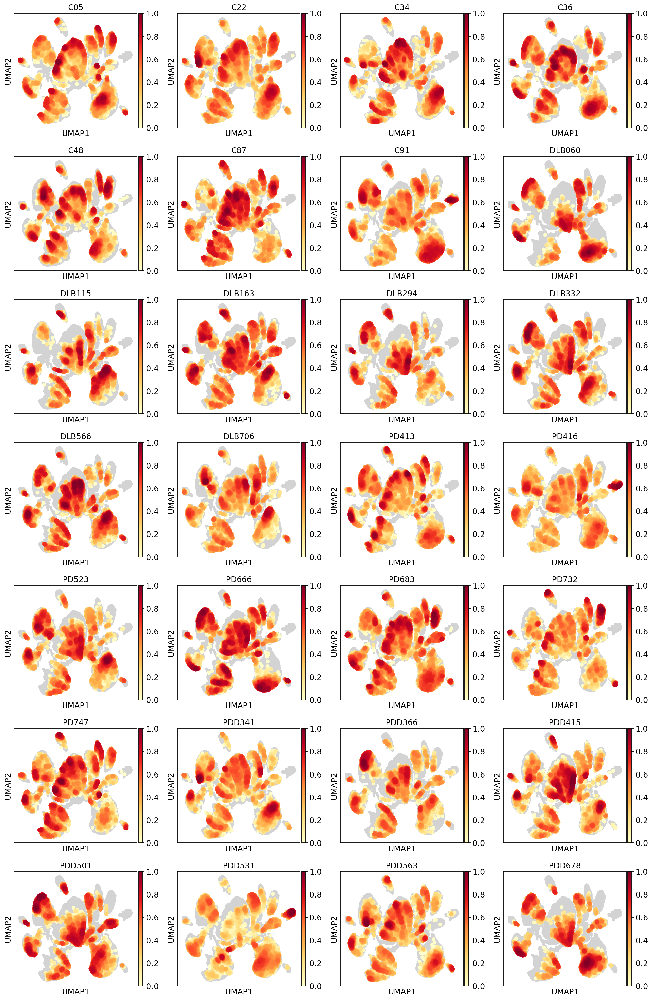

In [65]:
rsc.tl.embedding_density(merged_adata, groupby="Patient")
sc.pl.embedding_density(merged_adata, groupby="Patient")

## **Find Marker**

In [66]:
import decoupler as dc

In [80]:
markers = dc.get_resource('PanglaoDB')
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
0,CTRB1,False,Enterocytes,Endoderm,True,0.000000,0.004394,True,0.003311,0.020480,9606,GI tract,0.017
1,CTRB1,True,Acinar cells,Endoderm,True,1.000000,0.000629,True,0.957143,0.015920,9606,Pancreas,0.017
2,KLK1,True,Endothelial cells,Mesoderm,True,0.000000,0.008420,True,0.000000,0.014915,9606,Vasculature,0.013
3,KLK1,False,Goblet cells,Endoderm,True,0.588235,0.005039,True,0.903226,0.012408,9606,GI tract,0.013
4,KLK1,False,Epithelial cells,Mesoderm,True,0.000000,0.008233,True,0.225806,0.013758,9606,Epithelium,0.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8456,SLC14A1,True,Urothelial cells,Mesoderm,True,0.000000,0.018170,True,0.000000,0.000000,9606,Urinary bladder,0.008
8457,UPK3A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8458,UPK1A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8459,UPK2,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000


In [81]:
# Filter by canonical_marker and human
markers = markers[markers['human'] & 
                  markers['canonical_marker'] & 
                  (markers['organ'] == 'Brain')]# &
                  #(markers['human_sensitivity'] > 0.5)]

# Remove duplicated entries
markers = markers[~markers.duplicated(['cell_type', 'genesymbol'])]
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
91,RARRES2,True,Ependymal cells,Ectoderm,True,0.0,0.078782,True,0.000000,0.000000,9606,Brain,0.030
117,CEBPA,True,Microglia,Ectoderm,True,0.0,0.000000,True,0.193182,0.025223,9606,Brain,0.025
125,EGFR,True,Bergmann glia,Ectoderm,True,0.0,0.022243,True,0.000000,0.012771,9606,Brain,0.014
126,EGFR,True,Neuroblasts,Ectoderm,True,0.0,0.022243,True,0.000000,0.012769,9606,Brain,0.014
172,WT1,True,Neuroblasts,Ectoderm,True,0.0,0.022556,True,0.000000,0.000000,9606,Brain,0.010
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8342,COL23A1,True,Tanycytes,Ectoderm,True,0.0,0.000000,True,0.952381,0.004755,9606,Brain,0.005
8343,LHX2,True,Tanycytes,Ectoderm,True,0.0,0.005326,True,0.047619,0.114045,9606,Brain,0.092
8344,COL25A1,True,Tanycytes,Ectoderm,True,0.0,0.010338,True,0.380952,0.007003,9606,Brain,0.008
8399,VAMP1,True,Trigeminal neurons,Ectoderm,True,0.0,0.000000,True,0.000000,0.000000,9606,Brain,0.003


In [82]:
dc.run_ora(
    mat=merged_adata,
    net=markers,
    source='cell_type',
    target='genesymbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

Running ora on mat with 213478 samples and 5000 targets for 26 sources.


100%|██████████| 213478/213478 [03:27<00:00, 1030.42it/s]


In [83]:
merged_adata.obsm['ora_estimate'].shape

(213478, 26)

In [84]:
acts = dc.get_acts(merged_adata, obsm_key='ora_estimate')

acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e
acts

AnnData object with n_obs × n_vars = 213478 × 26
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_Patient'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'tsne', 'leiden', 'louvain', 'leiden_colors', 'louvain_colors', 'kmeans_colors', 'umap_density_Patient_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_tsne', 'ora_estimate', 'ora_pvals'

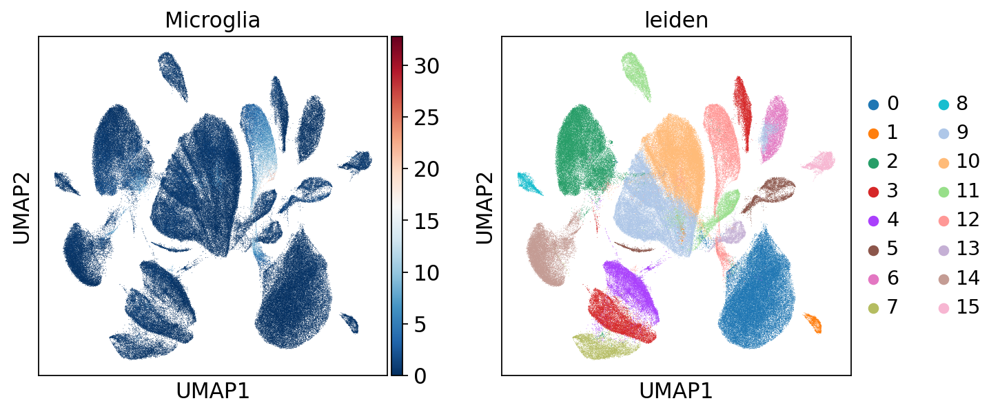

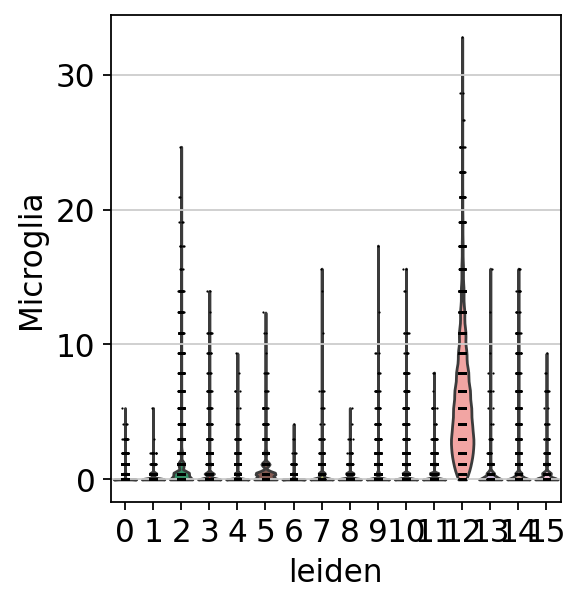

In [85]:
sc.pl.umap(acts, color=['Microglia', 'leiden'], cmap='RdBu_r')
sc.pl.violin(acts, keys=['Microglia'], groupby='leiden')

In [86]:
merged_adata_marker_df = dc.rank_sources_groups(acts, groupby='leiden', reference='rest', method='t-test_overestim_var')
merged_adata_marker_df

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,0,rest,Oligodendrocytes,350.573536,13.041033,0.000000e+00,0.000000e+00
1,0,rest,Schwann cells,259.784434,5.413538,0.000000e+00,0.000000e+00
2,0,rest,Oligodendrocyte progenitor cells,27.311845,0.420249,3.453792e-163,3.904286e-163
3,0,rest,Ependymal cells,10.799113,0.055339,3.632339e-27,3.777632e-27
4,0,rest,Choroid plexus cells,-5.447829,-0.018046,5.113684e-08,5.113684e-08
...,...,...,...,...,...,...,...
411,9,rest,Oligodendrocyte progenitor cells,-70.437764,-1.108520,0.000000e+00,0.000000e+00
412,9,rest,Schwann cells,-82.001170,-1.640514,0.000000e+00,0.000000e+00
413,9,rest,Oligodendrocytes,-84.188371,-3.438411,0.000000e+00,0.000000e+00
414,9,rest,Neural stem/precursor cells,-84.392337,-0.571849,0.000000e+00,0.000000e+00


In [87]:
n_ctypes = 3
ctypes_dict = merged_adata_marker_df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
ctypes_dict

{'0': ['Oligodendrocytes',
  'Schwann cells',
  'Oligodendrocyte progenitor cells'],
 '1': ['Tanycytes', 'Meningeal cells', 'Neurons'],
 '10': ['Immature neurons', 'Neurons', 'Pinealocytes'],
 '11': ['Immature neurons', 'Neurons', 'Interneurons'],
 '12': ['Microglia', 'Neural stem/precursor cells', 'Satellite glial cells'],
 '13': ['Pyramidal cells', 'Neurons', 'Retinal ganglion cells'],
 '14': ['Oligodendrocyte progenitor cells', 'Tanycytes', 'Neuroblasts'],
 '15': ['Pinealocytes', 'Purkinje neurons', 'Tanycytes'],
 '2': ['Astrocytes', 'Satellite glial cells', 'Bergmann glia'],
 '3': ['GABAergic neurons', 'Purkinje neurons', 'Interneurons'],
 '4': ['Cajal-Retzius cells', 'GABAergic neurons', 'Interneurons'],
 '5': ['Meningeal cells', 'Retinal ganglion cells', 'Adrenergic neurons'],
 '6': ['Neurons', 'Adrenergic neurons', 'Neuroendocrine cells'],
 '7': ['GABAergic neurons', 'Interneurons', 'Neuroblasts'],
 '8': ['Pyramidal cells', 'Interneurons', 'Neuroendocrine cells'],
 '9': ['Neuron

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


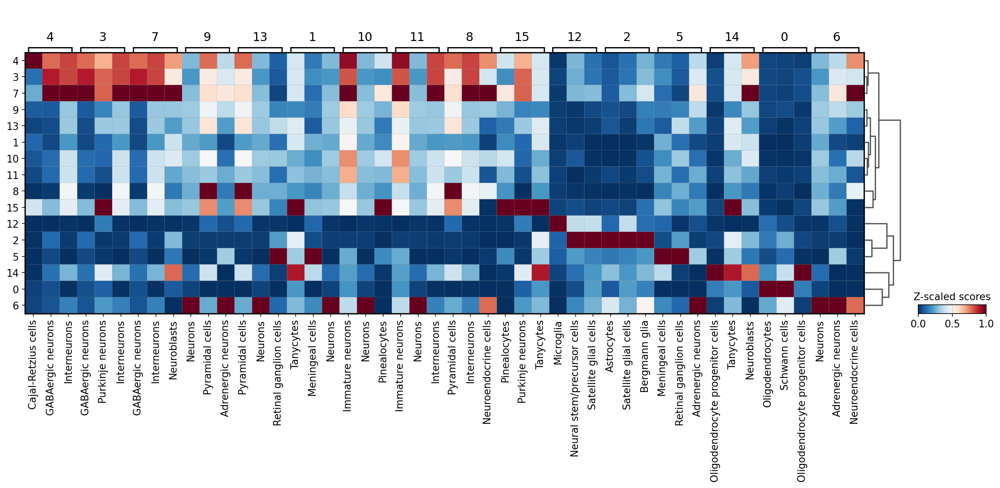

In [88]:
sc.pl.matrixplot(acts, ctypes_dict, 'leiden', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')

In [89]:
annotation_dict = merged_adata_marker_df.groupby('group').head(1).set_index('group')['names'].to_dict()
annotation_dict

{'0': 'Oligodendrocytes',
 '1': 'Tanycytes',
 '10': 'Immature neurons',
 '11': 'Immature neurons',
 '12': 'Microglia',
 '13': 'Pyramidal cells',
 '14': 'Oligodendrocyte progenitor cells',
 '15': 'Pinealocytes',
 '2': 'Astrocytes',
 '3': 'GABAergic neurons',
 '4': 'Cajal-Retzius cells',
 '5': 'Meningeal cells',
 '6': 'Neurons',
 '7': 'GABAergic neurons',
 '8': 'Pyramidal cells',
 '9': 'Neurons'}

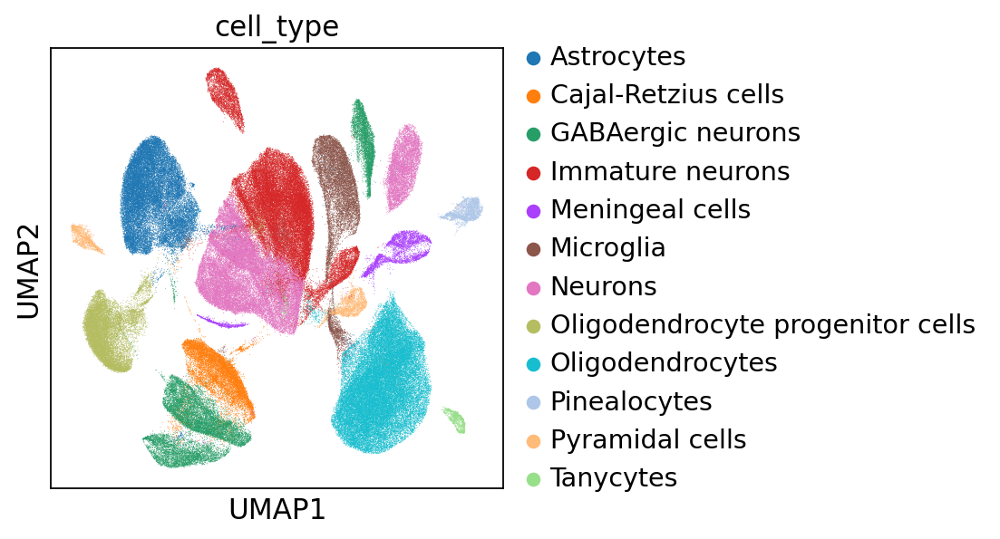

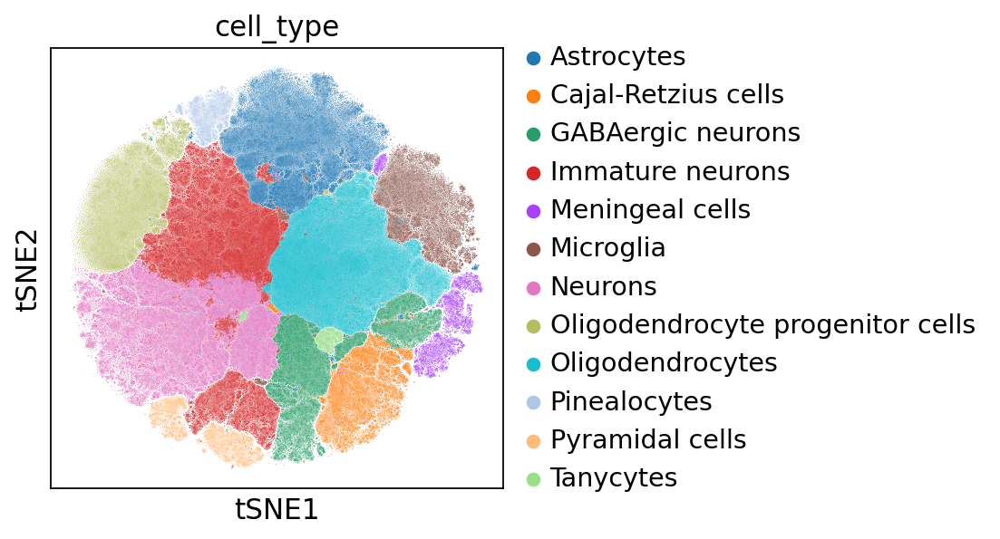

In [90]:
merged_adata.obs['cell_type'] = [annotation_dict[clust] for clust in merged_adata.obs['leiden']]

sc.pl.umap(merged_adata, color='cell_type')
sc.pl.tsne(merged_adata, color='cell_type')

In [91]:
merged_adata.write(results_file)

In [92]:
# Methods can be 't-test', 't-test_overestim_var' for overreestimates varience of each group
# 'wilcoxon' for rank-sum
# 'logreg' for logistic regression

#rsc.tl.rank_genes_groups_logreg(merged_adata, groupby="kmeans", use_raw=False)
#sc.pl.rank_genes_groups(merged_adata, n_genes=20, sharey=False, ncols=4)

In [93]:
#sc.settings.verbosity = 2  # reduce the verbosity
#merged_adata.write(results_file)

In [94]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", method="wilcoxon")
#sc.pl.rank_genes_groups(merged_adata, n_genes=25, sharey=False, ncols=4)

In [95]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", method="logreg", max_iter=1000)
#sc.pl.rank_genes_groups(merged_adata, n_genes=25, sharey=False, ncols=4)

In [96]:
#merged_adata = sc.read(results_file)

In [97]:
#pd.DataFrame(merged_adata.uns["rank_genes_groups"]["names"]).head(10)

In [98]:
#result = merged_adata.uns["rank_genes_groups"]
#groups = result["names"].dtype.names
#pd.DataFrame(
#    {
#        group + "_" + key[:1]: result[key][group]
#        for group in groups
#        for key in ["names"]#, "pvals"]
#    }
#).head(10)

In [99]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", groups=["3"], reference="15", method="wilcoxon")
#sc.pl.rank_genes_groups(merged_adata, groups=["3"], n_genes=20)

In [100]:
#merged_adata = sc.read(results_file)

In [101]:
#sc.pl.rank_genes_groups_violin(merged_adata, groups="3", n_genes=8)

In [102]:
#sc.pl.violin(merged_adata, ["C3", "P2RY12"], groupby= "leiden", use_raw=False)

## **Pseudobulking pyDeseq2**

In [103]:
#import scipy.sparse as sp

#sparse_matrix_after = sp.csr_matrix(merged_adata.X)
#merged_adata.X = sparse_matrix_after

In [104]:
merged_adata = sc.read(results_file)

In [105]:
merged_adata.obs['cell_type']

GATCAGTTCCTGTACC-1    Immature neurons
TTTGTCAGTAATCACC-1    Immature neurons
CGACCTTTCCACTCCA-1    Immature neurons
CCAATCCAGTTTCCTT-1           Tanycytes
TCGAGGCAGTGAACAT-1             Neurons
                            ...       
AGATTGCTCTTGACGA-1             Neurons
AGCTTGATCTGGAGCC-1             Neurons
GATCTAGTCCATGAAC-1          Astrocytes
GGCCGATCAATGGATA-1           Microglia
TGGACGCCAAATCCGT-1          Astrocytes
Name: cell_type, Length: 213478, dtype: category
Categories (12, object): ['Astrocytes', 'Cajal-Retzius cells', 'GABAergic neurons', 'Immature neurons', ..., 'Oligodendrocytes', 'Pinealocytes', 'Pyramidal cells', 'Tanycytes']

In [106]:
#Convert .X to sparse after moving back to CPU
merged_adata.X

array([[-0.07745935, -0.03103839,  1.57591582, ...,  0.16326288,
         0.32733905,  0.24564209],
       [-0.07553297, -0.03192338,  0.91077616, ...,  0.49313908,
        -0.28433828,  0.19836904],
       [-0.07239496, -0.033365  , -0.20195243, ...,  0.16614339,
         0.67085555,  1.39548856],
       ...,
       [-0.08014261, -0.02980568, -0.19198787, ..., -0.8994241 ,
        -0.1325563 , -0.64496916],
       [-0.07641663, -0.03151742, -0.19678   , ..., -1.13190167,
        -0.25524191, -0.86039146],
       [-0.07675909, -0.03136009, -0.19633954, ..., -1.11053425,
        -0.24396566, -0.84059161]])

In [107]:
merged_adata.layers['counts']

<213478x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 86573389 stored elements in Compressed Sparse Row format>

In [108]:
import pydeseq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
import random

In [109]:
merged_adata

AnnData object with n_obs × n_vars = 213478 × 5000
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_Patient', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'kmeans_colors', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'tsne', 'umap', 'umap_density_Patient_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [110]:
print(merged_adata.obs['Patient'])

GATCAGTTCCTGTACC-1      C36
TTTGTCAGTAATCACC-1      C36
CGACCTTTCCACTCCA-1      C36
CCAATCCAGTTTCCTT-1      C36
TCGAGGCAGTGAACAT-1      C36
                      ...  
AGATTGCTCTTGACGA-1    PD416
AGCTTGATCTGGAGCC-1    PD416
GATCTAGTCCATGAAC-1    PD416
GGCCGATCAATGGATA-1    PD416
TGGACGCCAAATCCGT-1    PD416
Name: Patient, Length: 213478, dtype: category
Categories (28, object): ['C05', 'C22', 'C34', 'C36', ..., 'PDD501', 'PDD531', 'PDD563', 'PDD678']


In [111]:
cluster_subset = merged_adata[merged_adata.obs['cell_type'] == 'Oligodendrocytes'].copy()
cluster_subset

AnnData object with n_obs × n_vars = 40589 × 5000
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_Patient', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'kmeans_colors', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'tsne', 'umap', 'umap_density_Patient_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [112]:
cluster_subset.layers['counts'].max()

136.0

In [113]:
cluster_subset_PD_CTL = cluster_subset[cluster_subset.obs['Conditions'].isin(['PD', 'CTL'])].copy()
cluster_subset_PDD_CTL = cluster_subset[cluster_subset.obs['Conditions'].isin(['PDD', 'CTL'])].copy()
cluster_subset_DLB_CTL = cluster_subset[cluster_subset.obs['Conditions'].isin(['DLB', 'CTL'])].copy()
cluster_subset_PD_PDD = cluster_subset[cluster_subset.obs['Conditions'].isin(['PD', 'PDD'])].copy()
cluster_subset_PD_DLB = cluster_subset[cluster_subset.obs['Conditions'].isin(['PD', 'DLB'])].copy()
cluster_subset_PDD_DLB = cluster_subset[cluster_subset.obs['Conditions'].isin(['PDD', 'DLB'])].copy()

In [114]:
cluster_subset_PDD_CTL.obs['Conditions']

TTTGGTTCAACTGCTA-1    CTL
GGATTACTCTCGTTTA-1    CTL
CAACTAGGTCATATCG-1    CTL
GTTTCTACACTCTGTC-1    CTL
CCTATTACACTAGTAC-1    CTL
                     ... 
GTTCTCGAGTGTCTCA-1    CTL
TTAACTCAGTGGGTTG-1    CTL
TACGGGCCAAGCTGTT-1    CTL
CTCGTCATCTAACTCT-1    CTL
CGTCACTCAGCTCGAC-1    CTL
Name: Conditions, Length: 24444, dtype: category
Categories (2, object): ['CTL', 'PDD']

In [115]:
cluster_subset_PDD_DLB

AnnData object with n_obs × n_vars = 19013 × 5000
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_Patient', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'kmeans_colors', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'tsne', 'umap', 'umap_density_Patient_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [116]:
pbs_pd_ctl = []
pbs_pdd_ctl = []
pbs_dlb_ctl = []
pbs_pd_pdd = []
pbs_pd_dlb = []
pbs_pdd_dlb = []

In [117]:
def process_subset(subset, pbs_list):
    
    for patient in subset.obs.Patient.unique():
    
        subset_patient = subset[subset.obs['Patient'] == patient, :].copy()
        subset_patient.X = subset_patient.layers['counts'] #change to raw counts using array

        rep_adata = sc.AnnData(X = subset_patient.X.sum(axis=0),
                               var=subset_patient.var[[]])
    
        rep_adata.obs_names = [patient]
        rep_adata.obs['Conditions'] = subset_patient.obs['Conditions'].iloc[0]
        rep_adata.obs['Patient'] = subset_patient.obs['Patient'].iloc[0]

        pbs_list.append(rep_adata)

In [118]:
process_subset(cluster_subset_PD_CTL, pbs_pd_ctl)
process_subset(cluster_subset_PDD_CTL, pbs_pdd_ctl)
process_subset(cluster_subset_DLB_CTL, pbs_dlb_ctl)
process_subset(cluster_subset_PD_PDD, pbs_pd_pdd)
process_subset(cluster_subset_PD_DLB, pbs_pd_dlb)
process_subset(cluster_subset_PDD_DLB, pbs_pdd_dlb)

In [119]:
pbs_dlb_ctl

[AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object 

In [120]:
pbs_pd_ctl

[AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object 

In [121]:
pb_1 = sc.concat(pbs_pd_ctl)
pb_2 = sc.concat(pbs_pdd_ctl)
pb_3 = sc.concat(pbs_dlb_ctl)
pb_4 = sc.concat(pbs_pd_pdd)
pb_5 = sc.concat(pbs_pd_dlb)
pb_6 = sc.concat(pbs_pdd_dlb)

In [122]:
datasets = [pb_1, pb_2, pb_3, pb_4, pb_5, pb_6]
counts_data = []
dds_data = []

for i, pb, in enumerate(datasets, start=1):
    
    pb.var['gene'] = pb.var_names.values
    counts = pd.DataFrame(pb.X, columns=pb.var['gene']).set_index([pb.obs['Patient']])
    globals()[f'counts_{i}'] = counts
    counts_data.append(counts)

#Change index of counts to 1-6, instead of 0-5
counts_dict = {}
for i, counts in enumerate(counts_data, start=1):
    counts_dict[i] = counts

In [123]:
counts_dict[1]

gene,SAMD11,AL645608.8,HES4,ISG15,TNFRSF4,VWA1,GABRD,HES5,TTC34,LINC00982,...,MT-ND2,MT-CO1,MT-CO2,MT-ATP6,MT-CO3,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-CYB
Patient,,,,,,,,,,,,,,,,,,,,,
C36,1.0,0.0,2.0,0.0,1.0,371.0,2.0,0.0,0.0,2.0,...,272.0,651.0,658.0,252.0,899.0,460.0,4.0,391.0,11.0,160.0
C34,3.0,0.0,1.0,0.0,0.0,503.0,1.0,2.0,0.0,0.0,...,766.0,1277.0,1727.0,625.0,1466.0,1439.0,24.0,992.0,135.0,572.0
PD666,0.0,0.0,1.0,0.0,0.0,145.0,0.0,4.0,3.0,2.0,...,196.0,232.0,270.0,148.0,345.0,217.0,9.0,152.0,15.0,85.0
PD732,0.0,0.0,0.0,7.0,0.0,172.0,0.0,0.0,0.0,0.0,...,315.0,57.0,308.0,70.0,223.0,125.0,5.0,117.0,10.0,108.0
PD523,2.0,0.0,0.0,10.0,2.0,424.0,2.0,0.0,2.0,0.0,...,3064.0,653.0,1829.0,1710.0,1410.0,4570.0,40.0,2109.0,79.0,1080.0
PD683,0.0,1.0,0.0,7.0,0.0,248.0,7.0,2.0,0.0,2.0,...,1525.0,1519.0,2827.0,1395.0,2480.0,2217.0,51.0,1900.0,133.0,767.0
PD413,0.0,0.0,0.0,1.0,0.0,151.0,0.0,0.0,0.0,2.0,...,374.0,297.0,494.0,187.0,356.0,245.0,6.0,230.0,11.0,151.0
C22,2.0,0.0,3.0,3.0,0.0,689.0,17.0,0.0,0.0,1.0,...,2906.0,1726.0,3044.0,1637.0,2781.0,3109.0,64.0,2179.0,225.0,1648.0
PD747,0.0,0.0,0.0,3.0,0.0,87.0,0.0,0.0,2.0,0.0,...,238.0,262.0,271.0,164.0,522.0,232.0,6.0,184.0,34.0,128.0


In [124]:
dds_data = []

for i, pb in enumerate(datasets, start=1):
    dds = DeseqDataSet(counts=counts_dict[i],
                       metadata = pb.obs,
                       design_factors=['Conditions'])
    
    globals()[f'dds_{i}'] = dds
    dds_data.append(dds)
    
    
dds_dict = {}
for i, dds in enumerate(dds_data, start=1):
    dds_dict[i] = dds

In [125]:
dds_dict

{1: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 2: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 3: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 4: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 5: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 6: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix'}

In [126]:
def deseq2_analyse(dds):
    sc.pp.filter_genes(dds, min_cells=1)
    dds.deseq2()
    sc.tl.pca(dds)
    sc.pl.pca(dds, color='Conditions', size = 200)


filtered out 283 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.29 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 5.62 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13


... done in 4.01 seconds.

Replacing 13 outlier genes.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.03 seconds.



    finished (0:00:00)


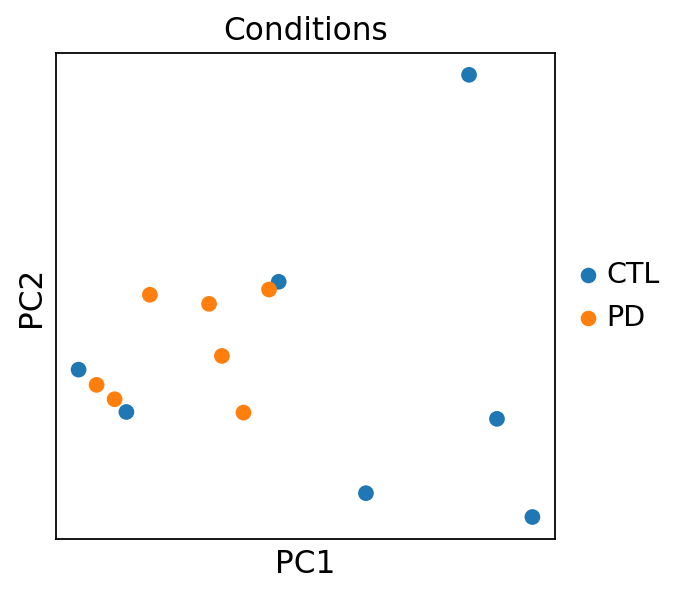

filtered out 240 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.37 seconds.

Fitting dispersion trend curve...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 5.71 seconds.

Fitting LFCs...
... done in 3.99 seconds.

Replacing 18 outlier genes.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 0.04 seconds.



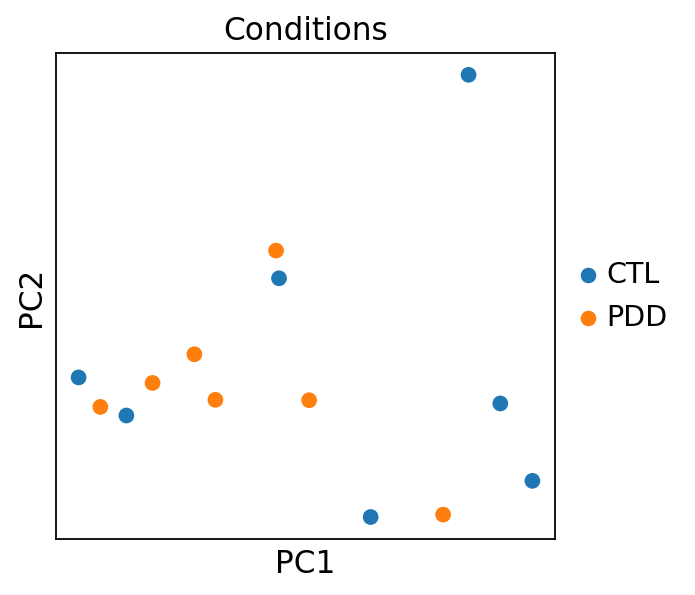

filtered out 268 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.35 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 6.35 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 3.89 seconds.

Replacing 10 outlier genes.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.03 seconds.



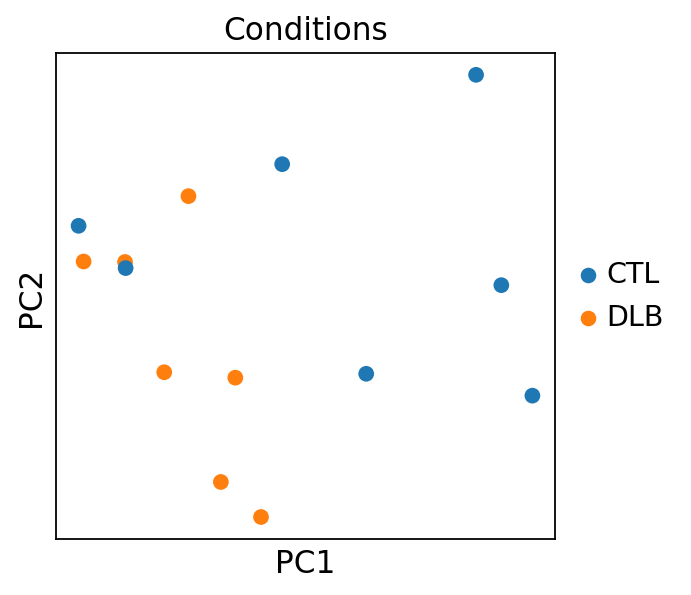

filtered out 281 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.25 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 5.67 seconds.

Fitting LFCs...
... done in 3.94 seconds.

Replacing 29 outlier genes.

Fitting dispersions...
... done in 0.06 seconds.

Fitting MAP dispersions...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 0.05 seconds.

Fitting LFCs...
... done in 0.05 seconds.



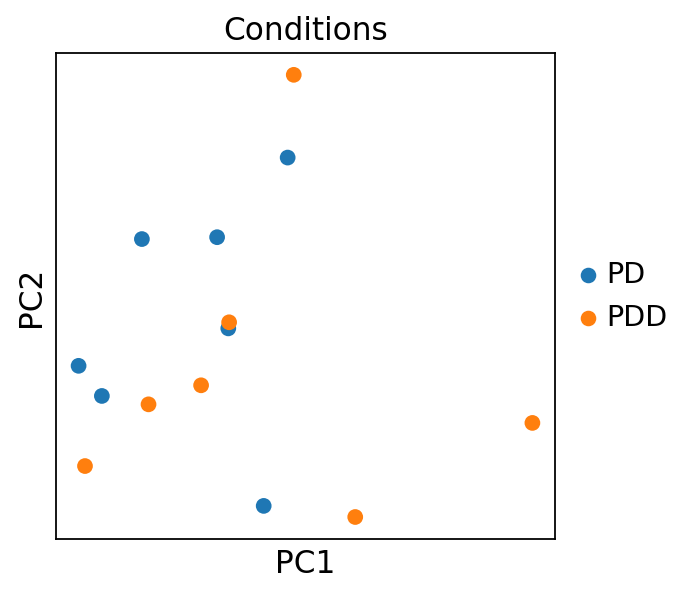

filtered out 303 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.22 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 5.48 seconds.

Fitting LFCs...
... done in 3.76 seconds.

Replacing 21 outlier genes.

Fitting dispersions...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 0.03 seconds.



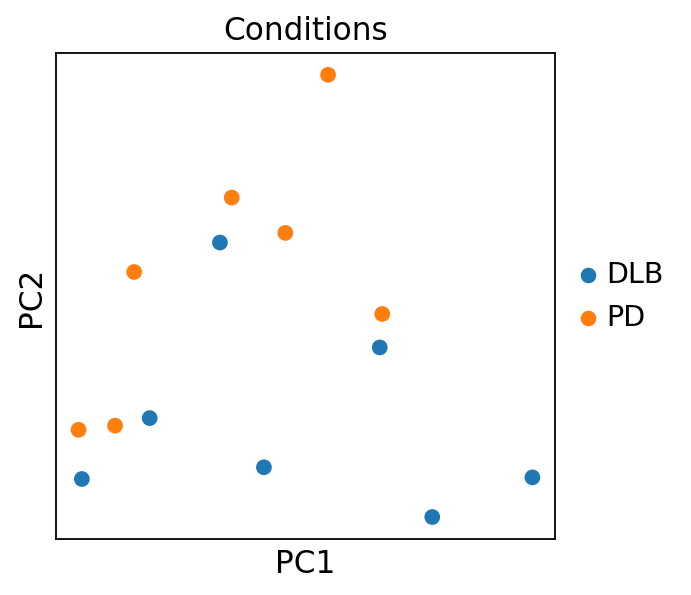

filtered out 263 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.41 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 5.59 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 3.78 seconds.

Replacing 14 outlier genes.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.03 seconds.



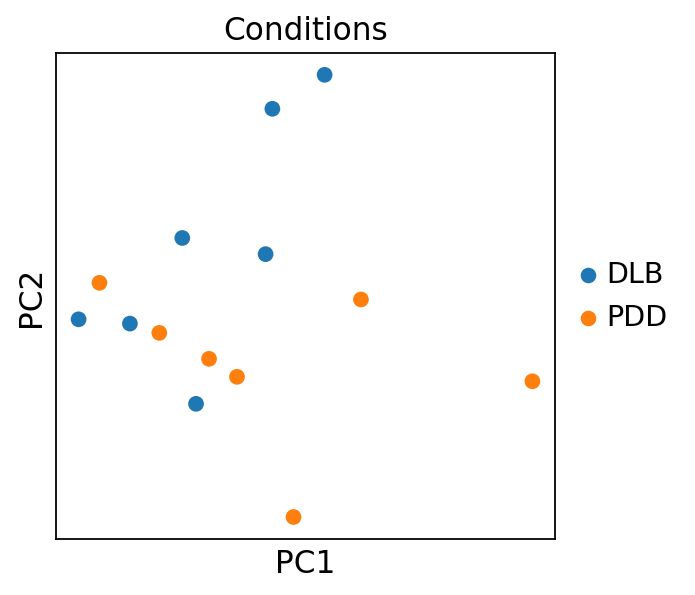

In [127]:
for i in range(1, 7):
    
    dds = dds_dict[i]
    deseq2_analyse(dds)

In [128]:
contrasts = [('Conditions', 'PD', 'CTL'), 
             ('Conditions', 'PDD', 'CTL'), 
             ('Conditions', 'DLB', 'CTL'),
             ('Conditions', 'PD', 'PDD'),
             ('Conditions', 'PD', 'DLB'),
             ('Conditions', 'PDD', 'DLB')]

start_res_data = []

for i, dds in dds_dict.items():
    contrast = contrasts[i-1]  # Adjusting index since keys start from 1
    start_res = DeseqStats(dds, contrast=contrast)
    
    globals()[f'start_res_{i}'] = start_res
    start_res_data.append(start_res)
    
    
start_res_dict = {}

for i, start_res in enumerate(start_res_data, start=1):
    start_res_dict[i] = start_res
    


In [129]:
for i in range(1,7):
    start_res_dict[i].summary()

Running Wald tests...
... done in 0.99 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions PD vs CTL
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
gene                                                                         
SAMD11        0.997787       -1.960986  1.575365 -1.244782  0.213212  0.99987
AL645608.8    0.063259        1.066531  3.378136  0.315716  0.752218  0.99987
HES4          1.163361       -1.869181  1.226366 -1.524163  0.127468  0.99987
ISG15         4.090390        1.622233  0.933632  1.737551  0.082290  0.99987
TNFRSF4       0.600354        0.676634  1.997238  0.338785  0.734772  0.99987
...                ...             ...       ...       ...       ...      ...
MT-ND3      926.165904        0.274644  0.549525  0.499784  0.617227  0.99987
MT-ND4L      21.178370        0.549120  0.576405  0.952662  0.340761  0.99987
MT-ND4      655.692871        0.255671  0.484625  0.527564  0.597802  0.99987
MT-ND5       59.359386       -0.043249  0.561955 -0.076962  0.938654  0.99987
MT-CY

... done in 1.00 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions PDD vs CTL
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
gene                                                                    
SAMD11         1.288231       -1.898628  1.395883 -1.360162  0.173779   
AL645608.8     0.231007        1.642583  3.193134  0.514411  0.606965   
HES4           1.736362       -0.971696  0.907959 -1.070198  0.284530   
ISG15          6.705358        2.218448  1.045141  2.122630  0.033785   
TNFRSF4        0.696465        0.448477  1.780345  0.251904  0.801115   
...                 ...             ...       ...       ...       ...   
MT-ND3      1677.459200        1.246110  0.541843  2.299764  0.021462   
MT-ND4L       28.486867        0.793533  0.659629  1.202998  0.228977   
MT-ND4      1074.690403        1.021504  0.539870  1.892132  0.058473   
MT-ND5        64.778759       -0.312061  0.569507 -0.547948  0.583727   
MT-CYB       558.773489        0.721825  0.482741  1.495261  0.1

... done in 1.03 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions DLB vs CTL
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
gene                                                                        
SAMD11         1.603871       -0.384129  1.279008 -0.300334  7.639226e-01   
AL645608.8     0.112401        0.763198  3.372113  0.226326  8.209476e-01   
HES4           1.531610       -1.177136  1.056109 -1.114598  2.650228e-01   
ISG15          4.099656        1.473145  1.019510  1.444954  1.484707e-01   
TNFRSF4        0.338491       -1.421965  2.829446 -0.502560  6.152740e-01   
...                 ...             ...       ...       ...           ...   
MT-ND3      2236.790990        1.948633  0.381174  5.112182  3.184584e-07   
MT-ND4L       27.552506        0.967002  0.456345  2.119016  3.408911e-02   
MT-ND4      1188.891415        1.390646  0.332985  4.176304  2.962835e-05   
MT-ND5        74.524158        0.332398  0.445529  0.746073  4.556231e-01   
MT-CYB       751

... done in 1.53 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions PD vs PDD
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
gene                                                                    
SAMD11         0.249623       -0.101175  2.695661 -0.037533  0.970060   
AL645608.8     0.237431       -0.558908  2.753278 -0.202997  0.839137   
HES4           0.668417       -0.915046  1.396006 -0.655474  0.512162   
ISG15          7.014601       -0.694215  0.882591 -0.786564  0.431537   
TNFRSF4        0.528747        0.278831  1.777132  0.156900  0.875324   
...                 ...             ...       ...       ...       ...   
MT-ND3      1416.679259       -0.998015  0.626096 -1.594029  0.110930   
MT-ND4L       25.869853       -0.284755  0.649502 -0.438420  0.661082   
MT-ND4       910.774037       -0.791648  0.607171 -1.303830  0.192291   
MT-ND5        50.315754        0.242685  0.583698  0.415771  0.677577   
MT-CYB       453.719163       -0.667966  0.512034 -1.304535  0.19

... done in 1.00 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions PD vs DLB
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
gene                                                                    
SAMD11         0.556666       -1.562911  2.157953 -0.724256  0.468908   
AL645608.8     0.146152        0.291328  3.301363  0.088245  0.929682   
HES4           0.564612       -0.727429  1.745837 -0.416665  0.676923   
ISG15          4.758460        0.092125  0.827533  0.111325  0.911359   
TNFRSF4        0.244444        1.943107  2.991331  0.649579  0.515964   
...                 ...             ...       ...       ...       ...   
MT-ND3      1847.571402       -1.670520  0.504885 -3.308711  0.000937   
MT-ND4L       24.796337       -0.359046  0.438012 -0.819716  0.412378   
MT-ND4       994.290689       -1.129401  0.449118 -2.514709  0.011913   
MT-ND5        58.123406       -0.363642  0.458264 -0.793521  0.427474   
MT-CYB       603.859190       -1.427046  0.393938 -3.622517  0.00

... done in 1.01 seconds.



In [130]:
from sanbomics.tools import id_map

In [131]:
de_data = []
sigs_data = []

for i, start_res in start_res_dict.items():
    de = start_res_dict[i].results_df
    de['gene_symbol'] = de.index
    sigs = de[(de.padj < 0.01) & (abs(de.log2FoldChange) > 0.5)]
    
    globals()[f'de_{i}'] = de
    globals()[f'sigs_{i}'] = sigs
    
    de_data.append(de)
    sigs_data.append(sigs)
    
    
de_data_dict = {}
sigs_data_dict = {}

for i, de in enumerate(de_data, start=1):
    de_data_dict[i] = de

for i, sigs in enumerate(sigs_data, start=1):
    sigs_data_dict[i] = sigs

In [132]:
de_data_dict[1].sort_values('padj')

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,gene_symbol
gene,,,,,,,
TTTY15,6.552556,-4.388695,0.883875,-4.965292,6.859771e-07,0.003236,TTTY15
FAP,5.450803,2.781298,0.773456,3.595936,3.232268e-04,0.762330,FAP
AL389885.1,0.314774,1.149966,2.927189,0.392857,6.944253e-01,0.999870,AL389885.1
AL583836.1,0.516011,0.733315,1.856423,0.395015,6.928317e-01,0.999870,AL583836.1
PDLIM1,0.425809,1.051003,1.913365,0.549295,5.828027e-01,0.999870,PDLIM1
...,...,...,...,...,...,...,...
PSD2,11.528334,-0.344375,0.739511,-0.465679,6.414455e-01,0.999870,PSD2
EGR1,4.058600,0.224139,0.874582,0.256281,7.977340e-01,0.999870,EGR1
NME5,1.548567,-0.213378,0.908934,-0.234756,8.143982e-01,0.999870,NME5


In [133]:
sigs_data_dict[6]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,gene_symbol
gene,,,,,,,


In [134]:
dds_sigs_data = []

for i, dds in dds_dict.items():    
    dds_dict[i].layers['log1p'] = np.log1p(dds_dict[i].layers['normed_counts'])
    dds_sigs = dds_dict[i][:, sigs_data_dict[i].index]
    
    
    globals()[f'dds_sigs_{i}'] = dds_sigs
    dds_sigs_data.append(dds_sigs)

dds_sigs_data_dict = {}

for i, dds_sigs in enumerate(dds_sigs_data, start=1):
    dds_sigs_data_dict[i] = dds_sigs

In [135]:
dds_sigs_data_dict[2].obs['Patient']

C36          C36
C34          C34
PDD531    PDD531
PDD341    PDD341
PDD366    PDD366
PDD415    PDD415
PDD678    PDD678
PDD501    PDD501
PDD563    PDD563
C22          C22
C87          C87
C05          C05
C91          C91
C48          C48
Name: Patient, dtype: object

In [136]:
heat_map_data = []
ax_cluster_map = []

for i in range(1,7):
    heat_map = pd.DataFrame(dds_sigs_data_dict[i].layers['log1p'],
                            index=dds_sigs_data_dict[i].obs, 
                            columns=dds_sigs_data_dict[i].var_names)
    heat_map.set_index([dds_sigs_data_dict[i].obs['Conditions'], 
                        dds_sigs_data_dict[i].obs['Patient']], 
                       inplace=True)
    heat_map = heat_map.reindex(sorted(heat_map.columns), axis=1)
    heat_map = heat_map.T


    globals()[f'heat_map_{i}'] = heat_map
    
    
    heat_map_data.append(heat_map)
    

heat_map_data_dict = {}

for i, heat_map in enumerate(heat_map_data, start=1):
    heat_map_data_dict[i] = heat_map

In [137]:
heat_map_data_dict[2]

Conditions       CTL                 PDD                                \
Patient          C36       C34    PDD531    PDD341    PDD366    PDD415   
gene                                                                     
CCK         3.421305  2.021178  1.786035  0.891338  1.194840  1.019212   
SNAP25      4.990927  2.980939  3.380168  2.793788  3.944812  3.832131   
SNCG        3.078534  2.081299  2.622425  0.672396  0.000000  0.634196   
SPARCL1     4.161483  3.134621  2.622425  2.764012  3.078568  2.929064   
STMN2       3.676102  2.464375  2.851633  2.160031  2.068012  0.000000   
VSNL1       3.283218  3.267800  2.324553  1.355004  1.723848  2.829625   

Conditions                                     CTL                      \
Patient       PDD678    PDD501    PDD563       C22       C87       C05   
gene                                                                     
CCK         1.685681  2.256570  2.136855  3.863394  3.559230  4.134449   
SNAP25      3.349054  3.227867  2.699881  4.951027  4.332041  5.704415   
SNCG        0.000000  1.348097  0.000000  3.776612  3.067200  3.092139   
SPARCL1     2.727030  2.895943  2.625424  5.087560  4.733116  5.468555   
STMN2       1.457939  1.348097  1.142652  4.268017  1.484693  4.864227   
VSNL1       2.162543  2.256570  0.000000  4.468382  2.684744  4.924765   

Conditions                      
Patient          C91       C48  
gene                            
CCK         1.553808  4.896033  
SNAP25      3.246786  5.844533  
SNCG        2.334434  4.690117  
SPARCL1     2.574191  5.201080  
STMN2       2.538014  5.040204  
VSNL1       2.420899  4.848391

In [138]:
cluster_pd_ctl = []
cluster_pdd_ctl = []
cluster_dlb_ctl = []
cluster_pd_pdd = []
cluster_pd_dlb = []
cluster_pdd_dlb = []

def cluster_heat_map(heat_map_value, cluster_list):
    cluster_heat_map = sns.clustermap(heat_map_value, z_score=0, cmap='RdYlBu_r')
    cluster_list.append(cluster_heat_map)
        

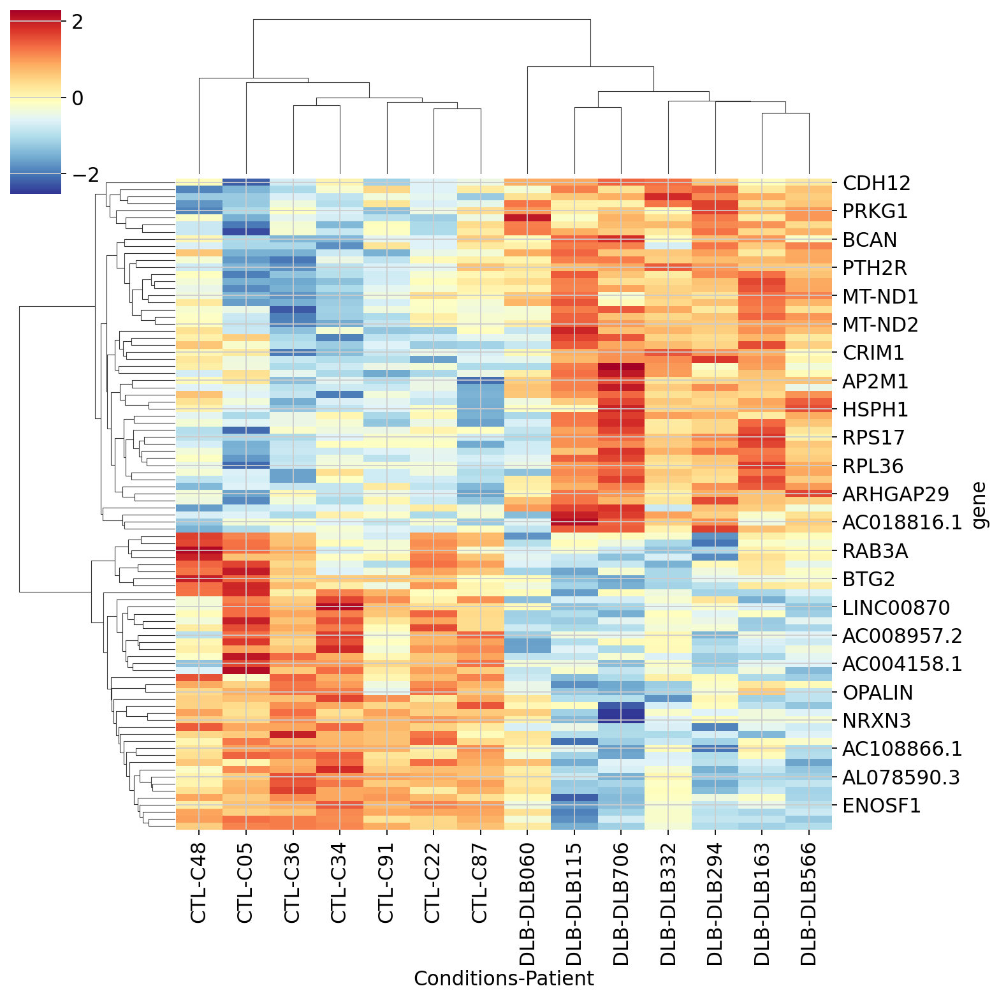

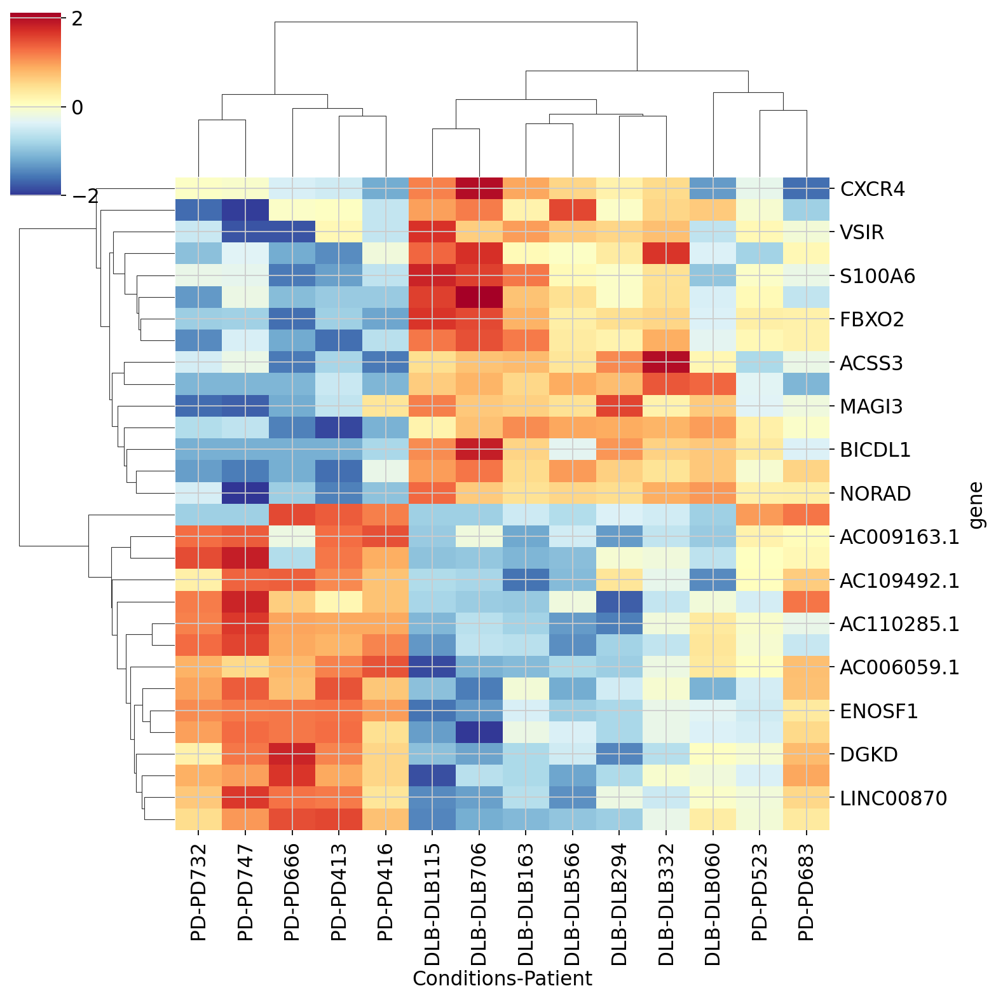

In [139]:
#cluster_heat_map(heat_map_data_dict[1], cluster_pd_ctl)
#cluster_heat_map(heat_map_data_dict[2], cluster_pdd_ctl)
cluster_heat_map(heat_map_data_dict[3], cluster_dlb_ctl)
#cluster_heat_map(heat_map_data_dict[4], cluster_pd_pdd)
cluster_heat_map(heat_map_data_dict[5], cluster_pd_dlb)
#cluster_heat_map(heat_map_data_dict[6], cluster_pdd_dlb)

In [140]:
import sanbomics
from sanbomics.plots import volcano

In [141]:
volcano_pd_ctl = []
volcano_pdd_ctl = []
volcano_dlb_ctl = []
volcano_pd_pdd = []
volcano_pd_dlb = []
volcano_pdd_dlb = []

def volcano_pseudobulk(de_value, plot_list):
    
    plot = volcano(de_value, 
                    symbol='gene_symbol', 
                    top_right_frame = True,
                    to_label = 10,
                    log2fc_thresh=0.75,
                    pval_thresh=0.05,
                    baseMean='baseMean',
                    figsize=(10,10))
    
    plot_list.append(plot)

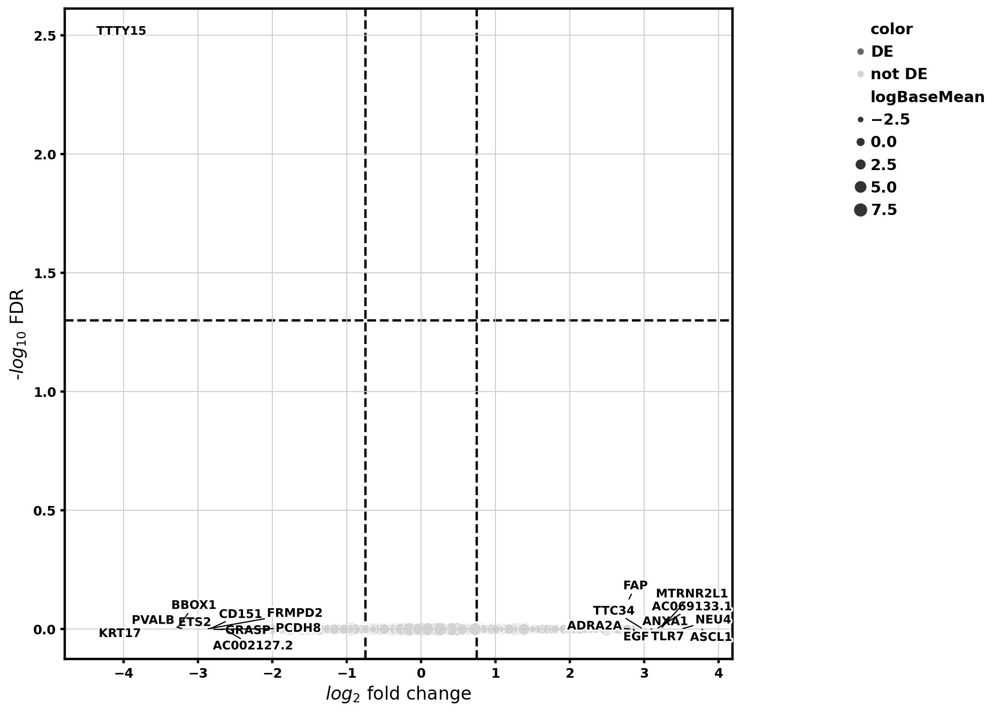

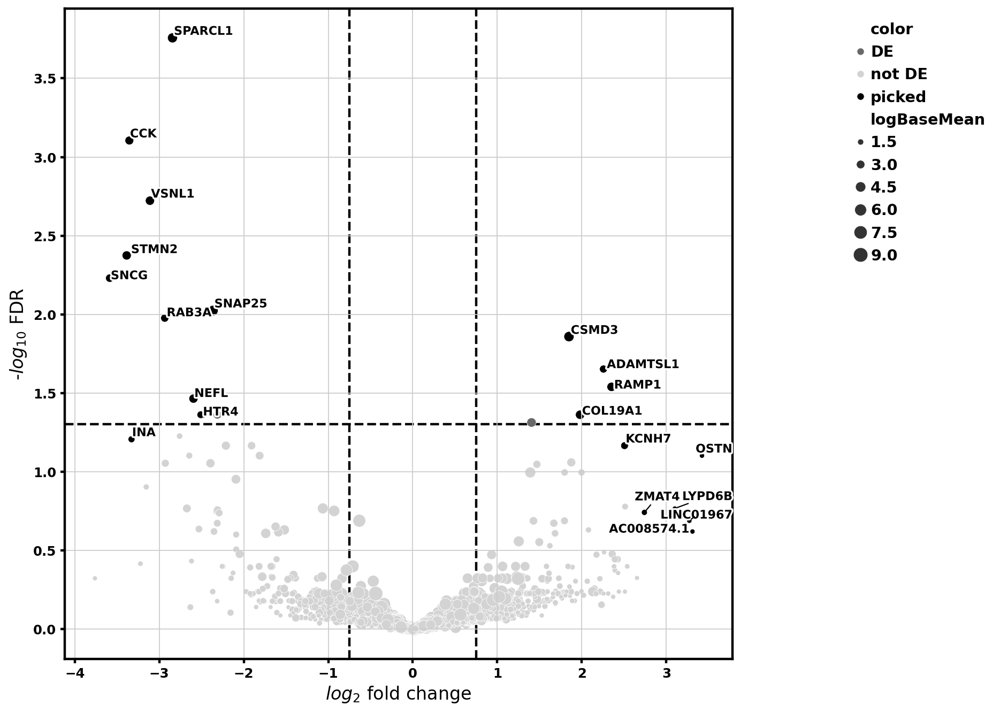

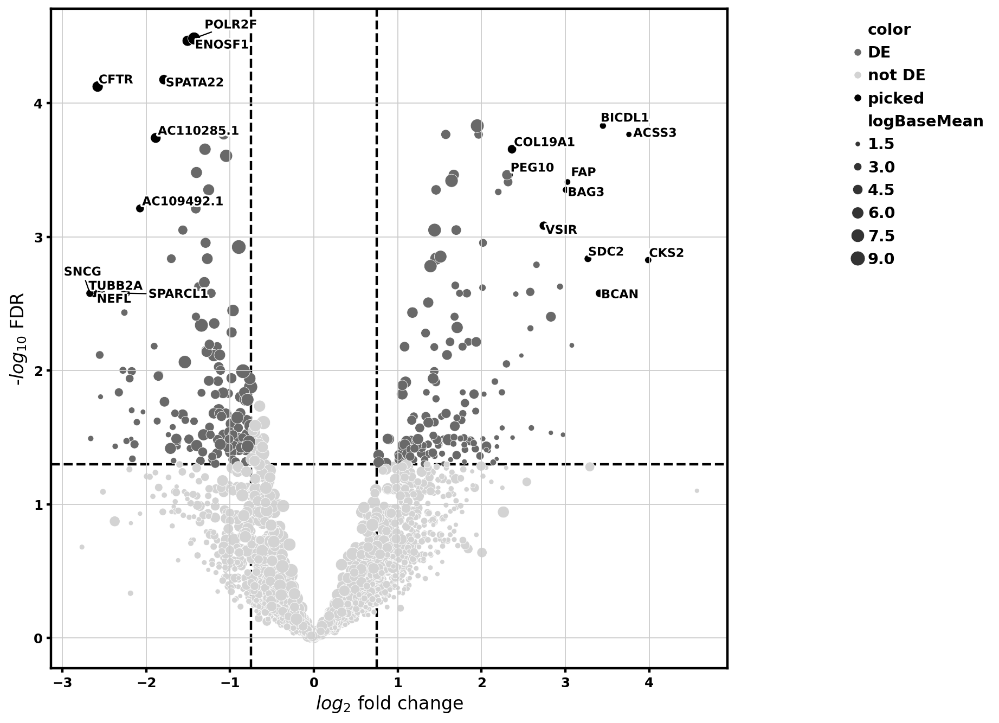

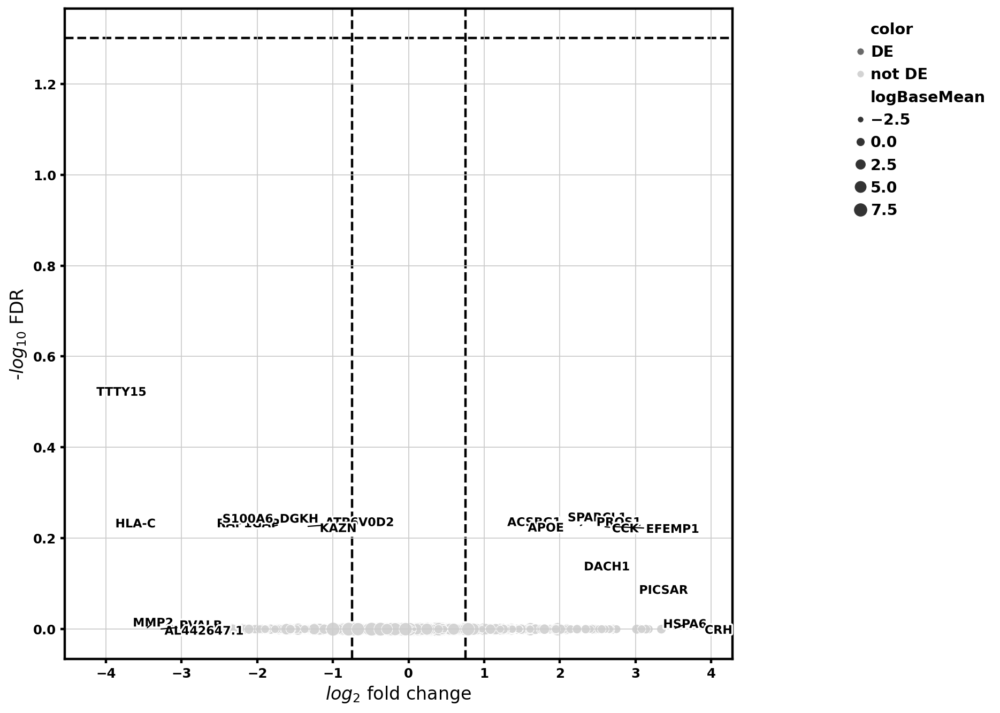

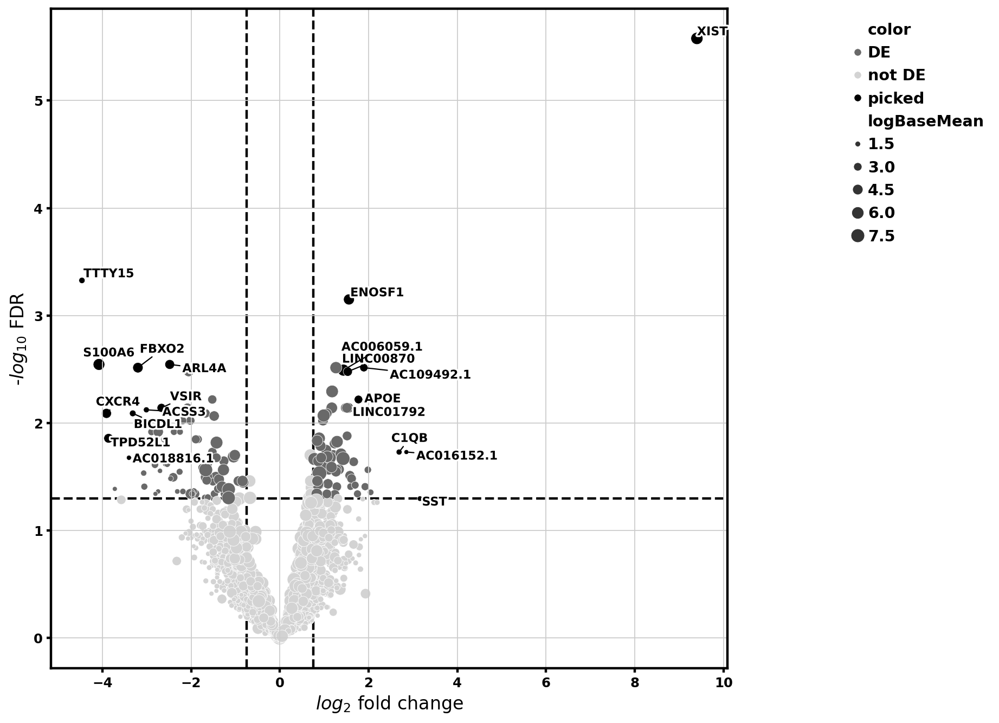

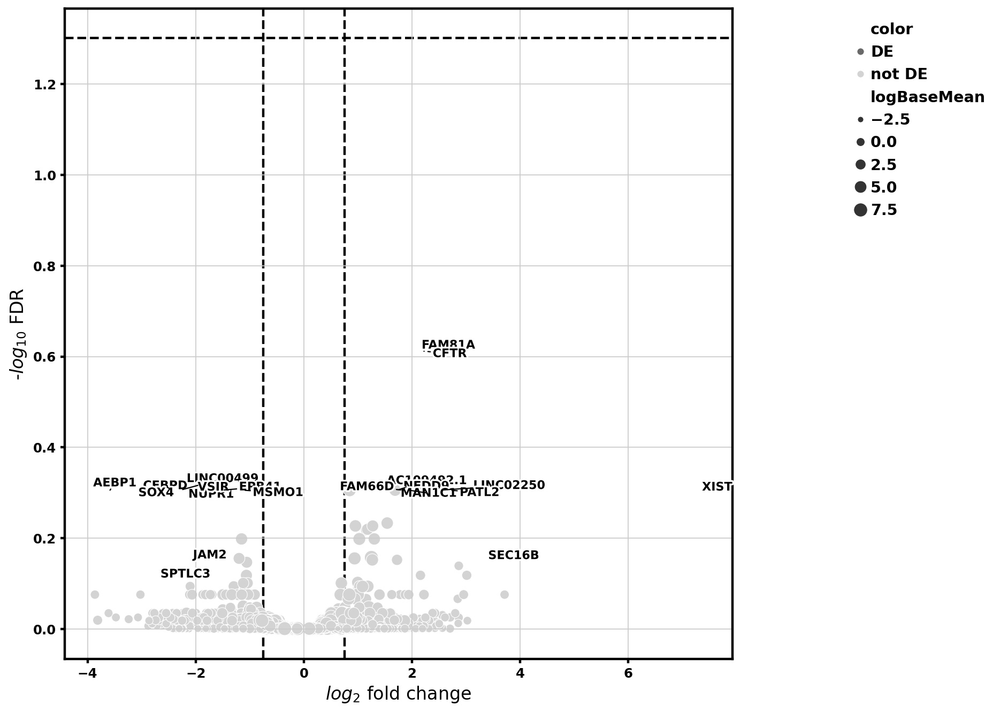

In [142]:
volcano_pseudobulk(de_data_dict[1], volcano_pd_ctl)
volcano_pseudobulk(de_data_dict[2], volcano_pdd_ctl)
volcano_pseudobulk(de_data_dict[3], volcano_dlb_ctl)
volcano_pseudobulk(de_data_dict[4], volcano_pd_pdd)
volcano_pseudobulk(de_data_dict[5], volcano_pd_dlb)
volcano_pseudobulk(de_data_dict[6], volcano_pdd_dlb)